In [53]:
import pathlib
import pickle
from collections import namedtuple
import platform

import pandas as pd
import numpy as np
from numpy import pi as PI
import pymc3 as pm
import theano.tensor as tt
from sklearn.preprocessing import StandardScaler, scale


import matplotlib.pyplot as pl
import matplotlib.dates as mdates
from matplotlib import rcParams
import arviz as az

In [15]:
def print_versions(*pkg):
    print(f'python: {platform.python_version()}')
    for pkgi in pkg:
        print(f'{pkgi.__name__}: {pkgi.__version__}')

print_versions(pd, np, pm, az)

python: 3.7.3
pandas: 0.24.2
numpy: 1.16.4
pymc3: 3.7
arviz: 0.4.1


In [18]:
%matplotlib inline
az.style.use('arviz-darkgrid')

As a first attempt I am going to model the timeseries using a Gaussian Random Walk.
I am also going to impute the missing data by modeling it

In [24]:
years = mdates.YearLocator(day=15, base=2)
months = mdates.MonthLocator(bymonthday=15)
rcParams['xtick.major.size'] = 8
rcParams['xtick.minor.size'] = 4
rcParams['xtick.minor.visible'] = True
rcParams['xtick.labelsize'] = 16
rcParams['ytick.labelsize'] = 16
rcParams['axes.labelsize'] = 16
rcParams['axes.titlesize'] = 18
rcParams['axes.formatter.limits'] = (-3, 2)

In [21]:
home = pathlib.Path.home()
proj_path = home / 'PROJEX/SouthernOcean/'
proj_path.exists()

True

In [88]:
s.shape

(25,)

In [89]:
s

array([0.032, 0.064, 0.096, 0.128, 0.16 , 0.192, 0.224, 0.256, 0.288,
       0.32 , 0.352, 0.384, 0.416, 0.448, 0.48 , 0.512, 0.544, 0.576,
       0.608, 0.64 , 0.672, 0.704, 0.736, 0.768, 0.8  ])

In [90]:
aprox['delta']

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0.])

In [92]:
A.shape

(248, 25)

In [93]:
aprox['k']

array(0.)

In [22]:
df = pd.read_pickle('../../pickleJar/df.pkl')
#df.index.name=''
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 248 entries, 1997-09-01 to 2018-04-01
Data columns (total 14 columns):
sam        248 non-null float64
aao        248 non-null float64
iostz      248 non-null float64
iosostz    248 non-null float64
postz      248 non-null float64
posostz    248 non-null float64
aostz      248 non-null float64
aosostz    248 non-null float64
iopooz     241 non-null float64
popooz     188 non-null float64
aopooz     248 non-null float64
iosaaz     248 non-null float64
posaaz     248 non-null float64
aosaaz     248 non-null float64
dtypes: float64(14)
memory usage: 29.1 KB


In [23]:
df.head()

,sam,aao,iostz,iosostz,postz,posostz,aostz,aosostz,iopooz,popooz,aopooz,iosaaz,posaaz,aosaaz
date,,,,,,,,,,,,,,
1997-09-01,0.69,0.122,0.24396,0.19464,0.23765,0.15677,0.35295,0.21213,0.180950,0.154737,0.194558,0.19830,0.16906,0.28457
1997-10-01,-1.78,-0.595,0.23801,0.18567,0.25429,0.15624,0.33579,0.24524,0.195581,0.163974,0.235877,0.20853,0.15947,0.35077
1997-11-01,-3.17,-1.905,0.22475,0.21562,0.22035,0.20676,0.31870,0.31555,0.221278,0.232293,0.277545,0.25616,0.17670,0.45735
1997-12-01,-0.89,-0.835,0.22303,0.26677,0.19563,0.43561,0.27345,0.61580,0.275540,0.301326,0.388892,0.24011,0.18865,0.44453
1998-01-01,2.65,0.413,0.17366,0.23300,0.16382,0.30970,0.25799,0.46643,0.199565,0.194234,0.371978,0.21664,0.13944,0.43567


In [29]:
df.describe()

,sam,aao,iostz,iosostz,postz,posostz,aostz,aosostz,iopooz,popooz,aopooz,iosaaz,posaaz,aosaaz
count,248.000000,248.000000,248.000000,248.000000,248.000000,248.000000,248.000000,248.000000,241.000000,188.000000,248.000000,248.000000,248.000000,248.000000
mean,0.519879,0.175113,0.213579,0.216339,0.201598,0.237798,0.292012,0.363231,0.197709,0.193421,0.345294,0.213654,0.184731,0.441675
std,1.701669,0.973178,0.027127,0.058586,0.048607,0.107210,0.043535,0.125154,0.070319,0.057796,0.147801,0.034287,0.022662,0.141194
min,-5.770000,-2.798000,0.142600,0.147280,0.110340,0.119390,0.199870,0.182640,0.128662,0.112061,0.163787,0.158629,0.134620,0.218980
25%,-0.642500,-0.448250,0.194450,0.174935,0.164000,0.163355,0.261736,0.266058,0.164502,0.150147,0.246054,0.187442,0.170730,0.326484
50%,0.580000,0.197000,0.217491,0.201763,0.197431,0.186825,0.281545,0.342921,0.180248,0.171223,0.311200,0.208735,0.183385,0.423374
75%,1.652500,0.884500,0.233288,0.239613,0.231166,0.289744,0.315765,0.444249,0.221227,0.226092,0.409819,0.234868,0.197011,0.540948
max,4.920000,2.573000,0.287270,0.641870,0.335140,0.639570,0.415390,0.969560,1.067500,0.384627,1.422800,0.332510,0.253160,0.906591


In [24]:
df.rename(columns={col: col.strip() for col in df.columns}, inplace=True)

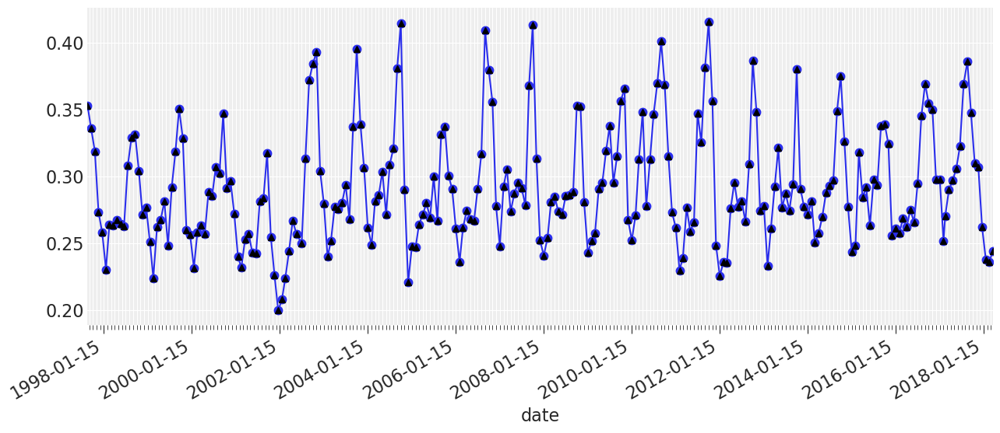

In [28]:
_, ax = pl.subplots(figsize=(15, 6))
df.aostz.plot(marker='.', ax=ax, markersize=15)
df.aostz.interpolate().plot(ls='', marker='^', color='k', ax=ax);
ax.xaxis_date()
ax.xaxis.set_major_locator(years)
ax.xaxis.set_minor_locator(months)
ax.grid(b=True, which='both')

In [30]:
d_aostz = df['aostz'].resample('MS').mean().interpolate()
d_aostz.shape

(248,)

In [41]:
d_aostz.head()

date
1997-09-01    0.35295
1997-10-01    0.33579
1997-11-01    0.31870
1997-12-01    0.27345
1998-01-01    0.25799
Freq: MS, Name: aostz, dtype: float64

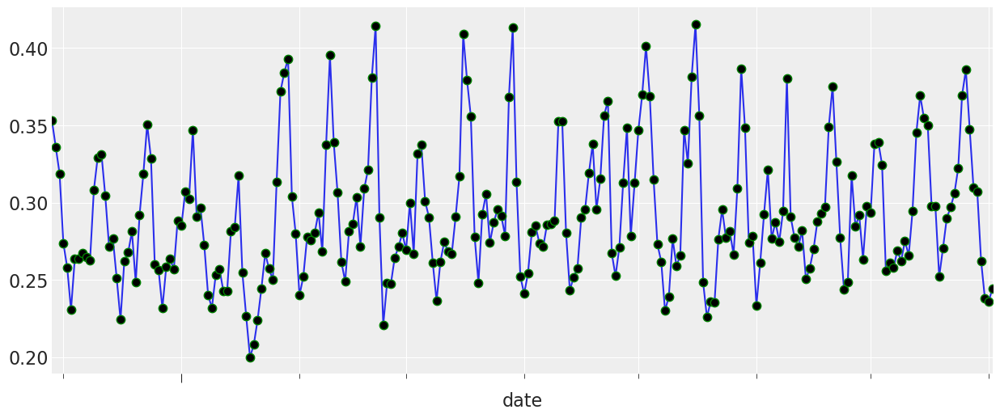

In [45]:
ms_years = mdates.YearLocator(day=1, base=1)
ms_months = mdates.MonthLocator(bymonthday=1)
_, ax = pl.subplots(figsize=(15, 6))
d_aostz.plot(marker='.', ax=ax, markersize=15, markerfacecolor='k', markeredgecolor='green')
#d_aostz.interpolate().plot(ls='', marker='^', color='k', ax=ax);
ax.xaxis_date()
ax.xaxis.set_major_locator(ms_years)
ax.xaxis.set_minor_locator(ms_months)
ax.grid(b=True, which='both')

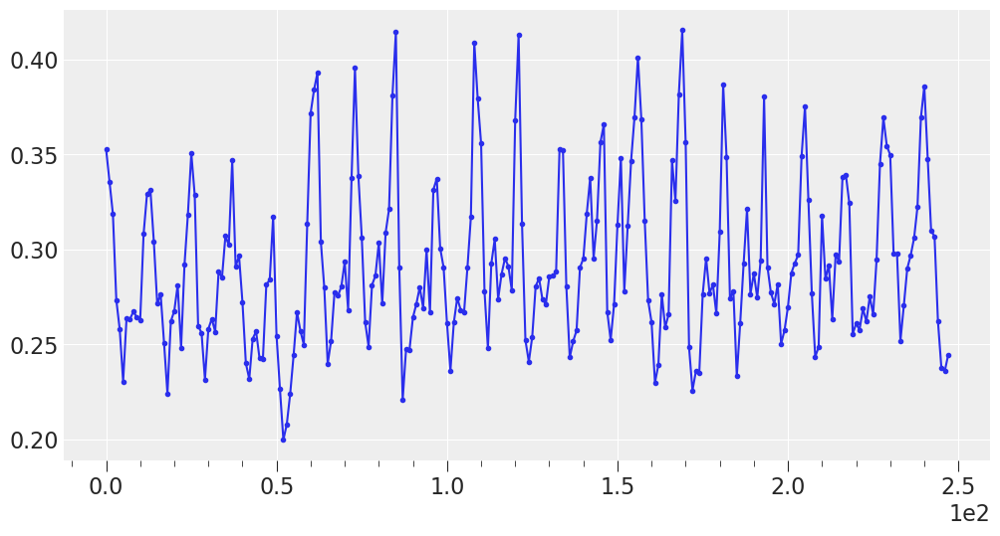

In [54]:
y = d_aostz.values
wl = 12/(2*np.pi)
x = np.arange(y.size)
ds = d_aostz.index.values
xn = (ds - ds.min()) / (ds.max() - ds.min())
f = pl.figure(figsize=(12, 6))
pl.plot(x, y, marker='.');

#### <u>Standardizing the Data</u>

In [55]:
std_scaler = StandardScaler()
y_s = std_scaler.fit_transform(y.reshape(-1, 1))
y_s = y_s.flatten()

### Modeling Trends
#### <u>Basic Trend Models</u>

In [59]:
with pm.Model() as m1:
    nuMinusOne = pm.Exponential('nuMinusOne', 1/29)
    nu_ = nuMinusOne + 1
    tau = pm.Gamma('tau', 0.001, 0.001)
    beta1 = pm.Normal('beta1', 0, 10)
    beta0 = pm.Normal('beta0', 0, 10)
    trend = pm.Deterministic('trend', beta1 * 12)
    mu_ = beta0 + beta1 * xn
    y_lik = pm.StudentT('y_lik', mu=mu_, lam=tau, nu=nu_, observed=y)

In [60]:
with m1:
    trace1 = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [beta0, beta1, tau, nuMinusOne]
Sampling 2 chains: 100%|██████████| 4000/4000 [00:04<00:00, 853.67draws/s] 


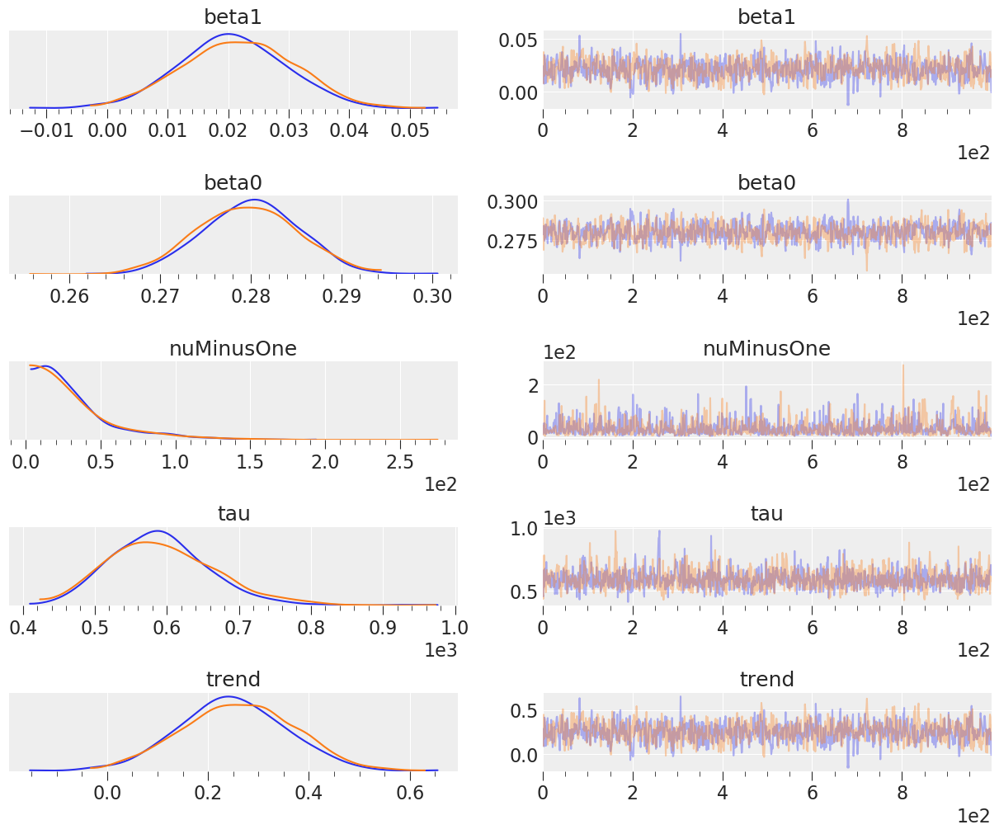

In [61]:
pm.traceplot(trace1);

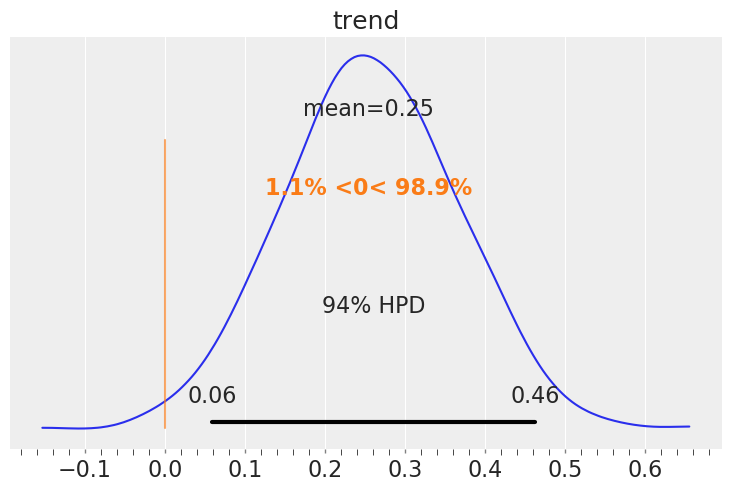

In [62]:
pm.plot_posterior(trace1, var_names=['trend'], round_to=2, ref_val=0);

In [63]:
with pm.Model() as m1n:
    sig = pm.HalfNormal('sig', 5)
    beta1 = pm.Normal('beta1', 0, 10)
    beta0 = pm.Normal('beta0', 0, 10)
    
    trend = pm.Deterministic('trend', beta1 * 12)
    mu_ = beta0 + beta1 * xn
    y_lik = pm.Normal('y_lik', mu=mu_, sd=sig, observed=y)

In [64]:
with m1n:
    trace_1n = pm.sample(1000, tune=1000, nuts_kwargs={'target_accept': 0.9})

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [beta0, beta1, sig]
Sampling 2 chains: 100%|██████████| 4000/4000 [00:03<00:00, 1202.75draws/s]


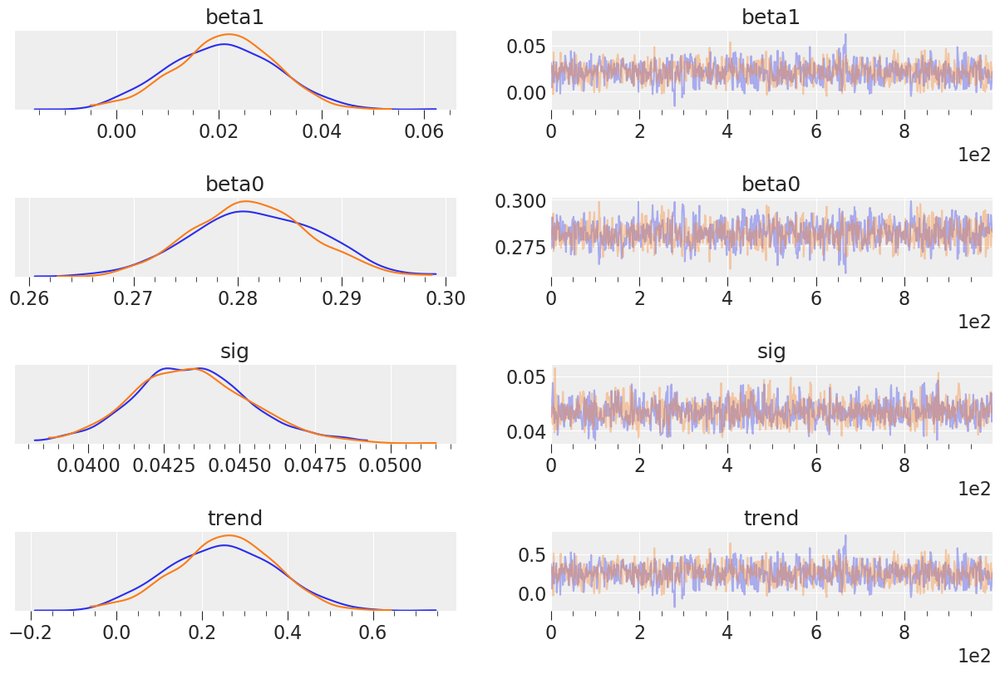

In [65]:
pm.traceplot(trace_1n);

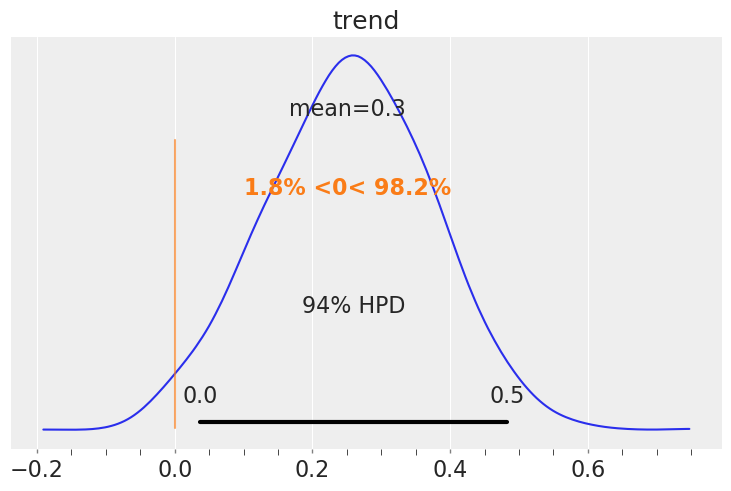

In [67]:
pm.plot_posterior(trace_1n, var_names=['trend'], ref_val=0);


 #### <u>Piecewise trend model</u>

In [75]:
def trend_model(m, t, n_changepoints=25, changepoints_prior_scale=0.05,
                growth_prior_scale=5, changepoint_range=0.8):
    """
    Piecewise linear trend with changepoint implementation in PyMC3.
    Input:
        m:                  (pm.Model)
        t:                  (np.array) MinMax scaled time
        n_changepoints:     (int) The number of changepoints to model
            changepoint_prior_scale(float/None): Scale of Laplace 
            prior on the delta vector
        growth_prior_scale: (float) Std Dev of prior on growth
        changepoint_range:  (float) Prop of history in which trend 
        changepoints will be estimated.
    return:
        g: (tt.vector) piecewice growth
        A: (np.array) growth rate adjustment matrix
        s: (tt.vector) changepoints
    """
    s = np.linspace(0, changepoint_range* np.max(t), n_changepoints + 1)[1:]
    A = (t[:, None] > s) * 1
    with m:
        k = pm.Normal('k', 0, growth_prior_scale)
        if changepoints_prior_scale is None:
            changepoints_prior_scale = pm.Exponential('tau', 1.5)
        
        # rate of change
        delta = pm.Laplace('delta', 0, changepoints_prior_scale, shape=n_changepoints)
        # offset
        m_offset = pm.Normal('m_offset', 0, 5)
        gamma = -s * delta
        g = (k + pm.math.dot(A, delta)) * t + (m_offset + pm.math.dot(A, gamma))
    return g, A, s

# Generate a PyMC3 Model context
m = pm.Model()

with m:
    y, A, s = trend_model(m, xn)
    sigma = pm.HalfCauchy('sigma', 0.5, testval=1)
    pm.Normal('obs', mu=y, sd=sigma, observed=y_s)

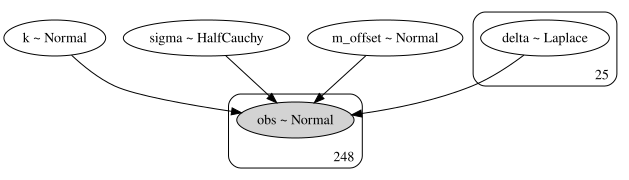

In [86]:
pm.model_to_graphviz(m)

Sanity check

Before we run the model, let’s define a small utility function. This function samples from the prior distribution of the model we defined and plots the expected value given the prior, i.e. the mean, and the standard deviation of the sampled values.

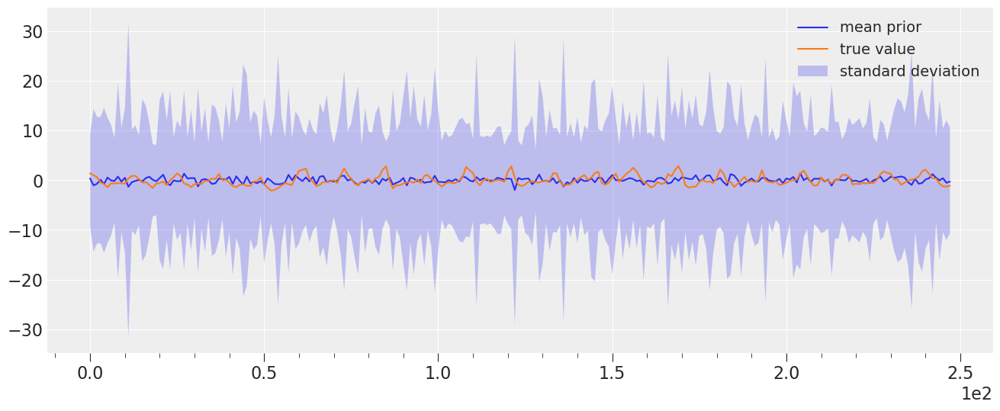

In [72]:
def sanity_check(m, y_obs):
    """
    :param m: (pm.Model)
    :param df: (pd.DataFrame)
    """
    # Sample from the prior and check the model is well defined.
    y_lik = pm.sample_prior_predictive(model=m, vars=['obs'])['obs']
    pl.figure(figsize=(16, 6))
    pl.plot(y_lik.mean(0), label='mean prior')
    pl.fill_between(np.arange(y_lik.shape[1]), -y_lik.std(0), y_lik.std(0),
                   alpha=0.25, label='standard deviation')
    pl.plot(y_obs, label='true value')
    pl.legend()

# run the sanity check
sanity_check(m, y_s)

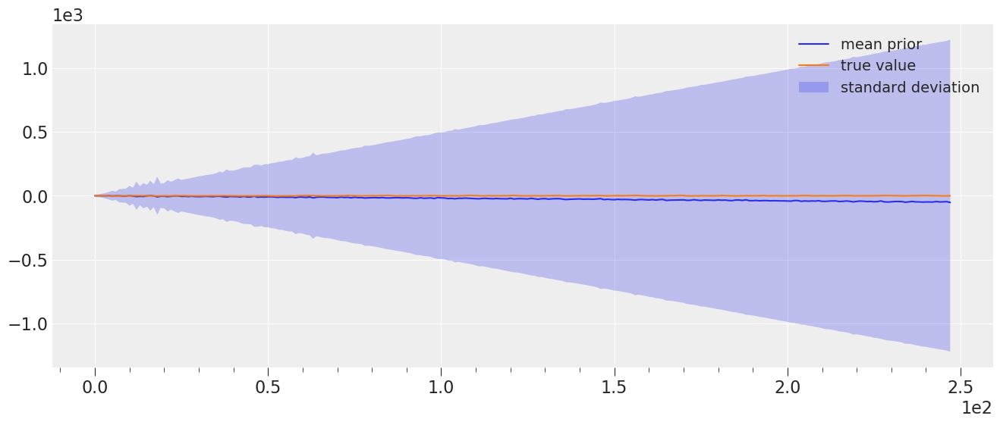

In [74]:
# Sanity check with unscaled time:
sanity_check(m, y_s)

### Inference

In [76]:
with m:
    aprox = pm.find_MAP()

def det_trend(k, m, delta, t, s, A):
    return (k + np.dot(A, delta)) * t + (m + np.dot(A, (-s * delta)))

/Users/erdemk/anaconda3/envs/bayesian_toa_project/lib/python3.7/site-packages/pymc3/tuning/starting.py:61: UserWarning: find_MAP should not be used to initialize the NUTS sampler, simply call pymc3.sample() and it will automatically initialize NUTS in a better way.
  warnings.warn('find_MAP should not be used to initialize the NUTS sampler, simply call pymc3.sample() and it will automatically initialize NUTS in a better way.')
logp = -300.76, ||grad|| = 76.781: 100%|██████████| 22/22 [00:00<00:00, 505.53it/s]  


In [83]:
g

Elemwise{mul,no_inplace}.0

AttributeError: 'TensorVariable' object has no attribute 'data'

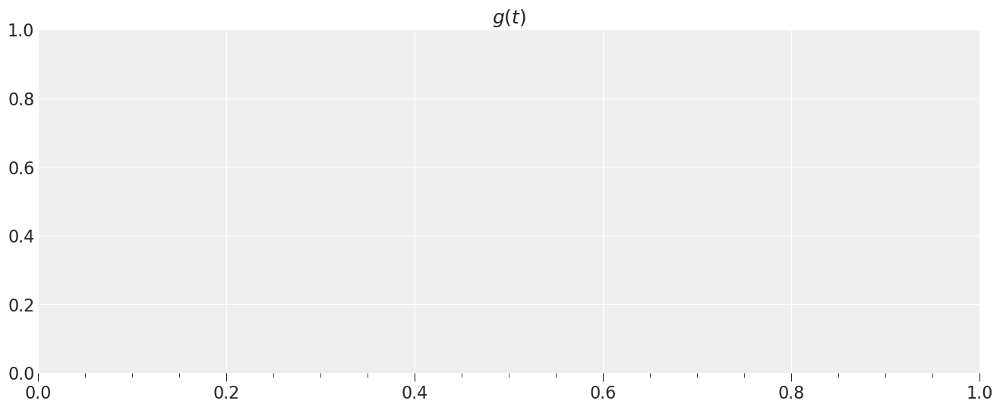

In [85]:
g= det_trend(aprox['k'], aprox['m_offset'], aprox['delta'],
            xn, s, A) * y.max()
pl.figure(figsize=(16, 6))
pl.title('$g(t)$')
pl.plot(g.data)
pl.scatter(np.arange(df.shape[0]), y, s=0.5, color='k')

### Seasonality
#### <u> single cosine with fixed wavelength</u>

In [46]:
with pm.Model() as m2_s:
    nuMinusOne = pm.Exponential('nuMinusOne', 1/29)
    nu_ = nuMinusOne + 1
    thresh = pm.Uniform('thresh', 0, 11)
    amp = pm.Uniform('amp', 0, 1)
    tau = pm.Gamma('tau', 10, 2)
    mu_ = amp * tt.cos((x - thresh)/ wl)
    y_lik = pm.StudentT('y_lik', mu=mu_, lam=tau, nu=nu_, observed=y_s)

In [47]:
with m2_s:
    trace_2_s = pm.sample(1000, tune=2000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [tau, amp, thresh, nuMinusOne]
Sampling 2 chains: 100%|██████████| 6000/6000 [00:06<00:00, 961.31draws/s] 


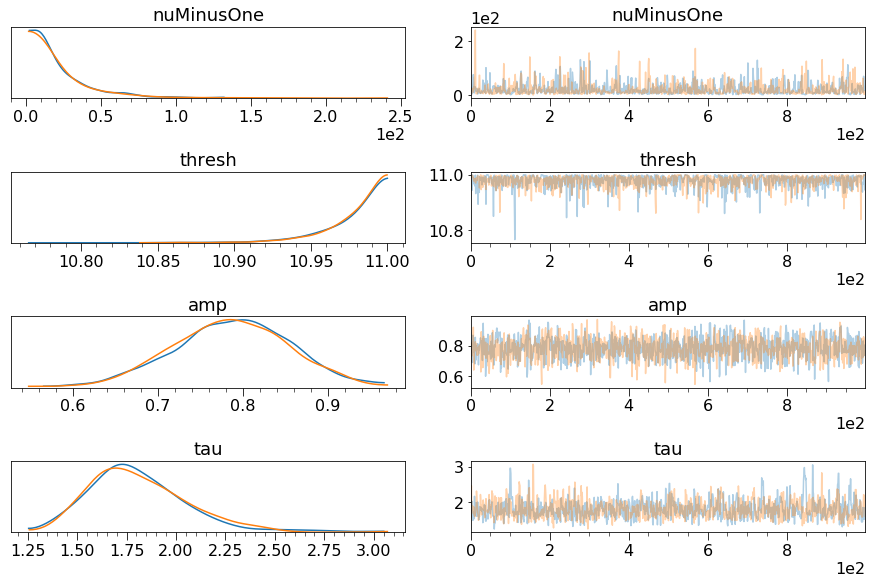

In [48]:
pm.traceplot(trace_2_s);

#### <u>Single sinuoid with inferred wavelength</u>

In [49]:
wl_lower = 11 / (2 * np.pi)
wl_upper = 13 / (2 * np.pi)

In [50]:
with pm.Model() as m2b_s:
    nuMinusOne = pm.Exponential('nuMinusOne', 1/29)
    nu_ = nuMinusOne + 1
    wl_ = pm.Uniform('wl', wl_lower, wl_upper)
    thresh = pm.Uniform('thresh', 0, 11)
    amp = pm.HalfNormal('amp', 1)
    tau = pm.Gamma('tau', 10, 2)
    mu_ = amp * tt.cos((x - thresh)/ wl_)
    y_lik = pm.StudentT('y_lik', mu=mu_, lam=tau, nu=nu_, observed=y_s)

In [51]:
with m2b_s:
    trace_2b_s = pm.sample(2000, tune=3000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [tau, amp, thresh, wl, nuMinusOne]
Sampling 2 chains: 100%|██████████| 10000/10000 [00:15<00:00, 644.77draws/s]
The acceptance probability does not match the target. It is 0.8818446131910329, but should be close to 0.8. Try to increase the number of tuning steps.
The gelman-rubin statistic is larger than 1.4 for some parameters. The sampler did not converge.
The estimated number of effective samples is smaller than 200 for some parameters.


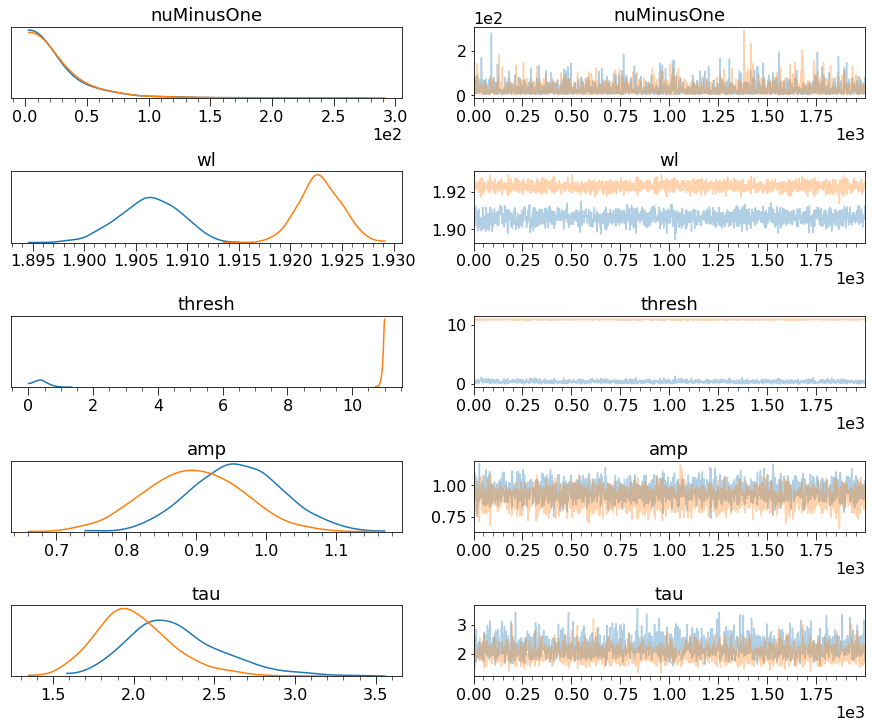

In [52]:
pm.traceplot(trace_2b_s);

#### <u>Seasonality based on Fourier Series</u>

In [46]:
N=3

In [47]:
wls = [2*np.pi *k / 12 for k in range(1, N+1)]

In [48]:
sinusoids = np.array([[np.cos(wli), np.sin(wli)] for wli in wls])

In [49]:
t = np.arange(0, 10)

In [50]:
precomp = np.array([[np.cos(wli * t), np.sin(wli*t)] for wli in wls]).reshape(N*2, 10).T.shape

In [51]:
sinusoids = sinusoids.reshape(N*2,1)
sinusoids.shape

(6, 1)

In [52]:
N=3
wls = [2*np.pi *k / 12 for k in range(1, N+1)]
sinusoids = np.array([[np.cos(wli*x), np.sin(wli*x)] 
                      for wli in wls]).reshape(N*2, -1).T

with pm.Model() as m2_fourier:
    nuMinusOne = pm.Exponential('nuMinusOne', 1/29)
    nu_ = nuMinusOne + 1
    f_coefs = pm.Normal('fourier_coefs', 0, sd=1, shape=(N*2))
    season = tt.dot(sinusoids, f_coefs)
    tau = pm.Gamma('tau', 10, 2) 
    y_lik = pm.StudentT('y_lik', mu=season, lam=tau, nu=nu_, observed=y_s)

NameError: name 'x' is not defined

In [60]:
with m2_fourier:
    trace_m2f = pm.sample(5000, tune=5000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [tau, fourier_coefs, nuMinusOne]
Sampling 2 chains: 100%|██████████| 20000/20000 [00:18<00:00, 1063.16draws/s]
There was 1 divergence after tuning. Increase `target_accept` or reparameterize.


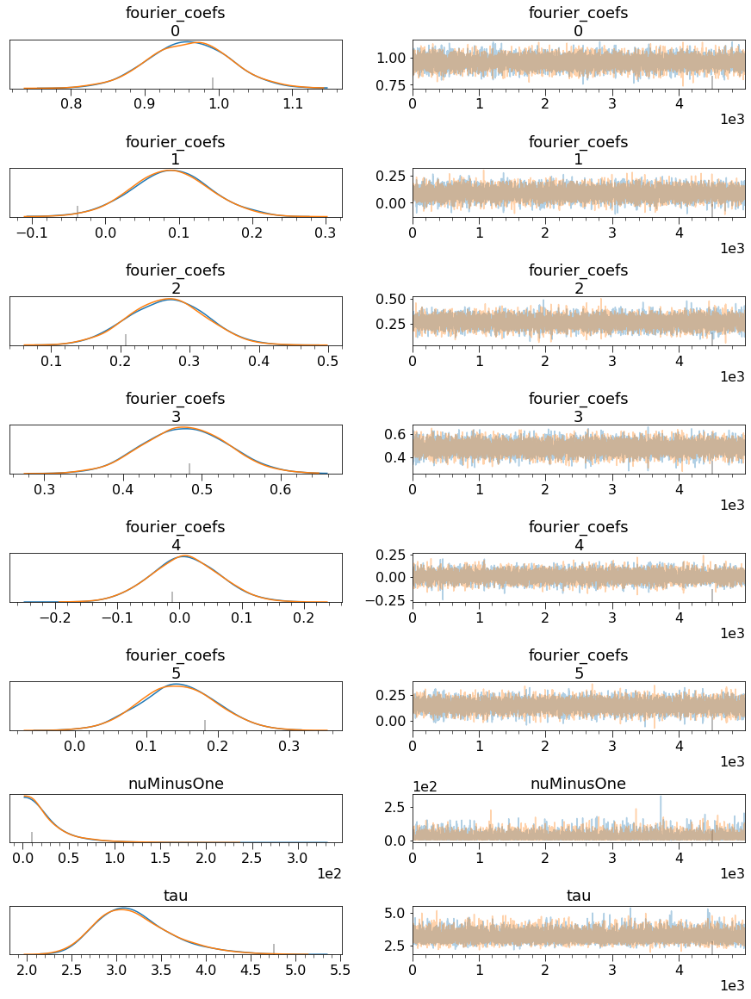

In [61]:
pm.traceplot(trace_m2f);

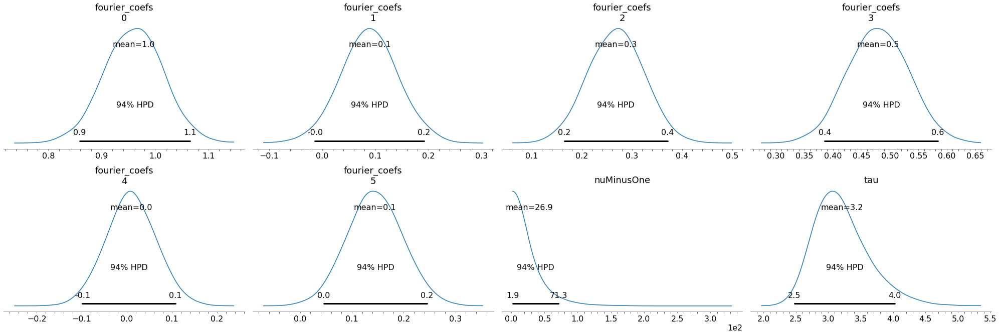

In [62]:
pm.plot_posterior(trace_m2f);

In [63]:
N=2
wls = [2*np.pi *k / 12 for k in range(1, N+1)]
sinusoids = np.array([[np.cos(wli*x), np.sin(wli*x)] 
                      for wli in wls]).reshape(N*2, -1).T

with pm.Model() as m2_fourier_2:
    nuMinusOne = pm.Exponential('nuMinusOne', 1/29)
    nu_ = nuMinusOne + 1
    f_coefs = pm.Normal('fourier_coefs', 0, sd=1, shape=(N*2))
    season = tt.dot(sinusoids, f_coefs)
    tau = pm.Gamma('tau', 10, 2) 
    y_lik = pm.StudentT('y_lik', mu=season, lam=tau, nu=nu_, observed=y_s)

In [64]:
with m2_fourier_2:
    trace_m2f2 = pm.sample(5000, tune=5000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [tau, fourier_coefs, nuMinusOne]
Sampling 2 chains: 100%|██████████| 20000/20000 [00:17<00:00, 1158.24draws/s]
There was 1 divergence after tuning. Increase `target_accept` or reparameterize.


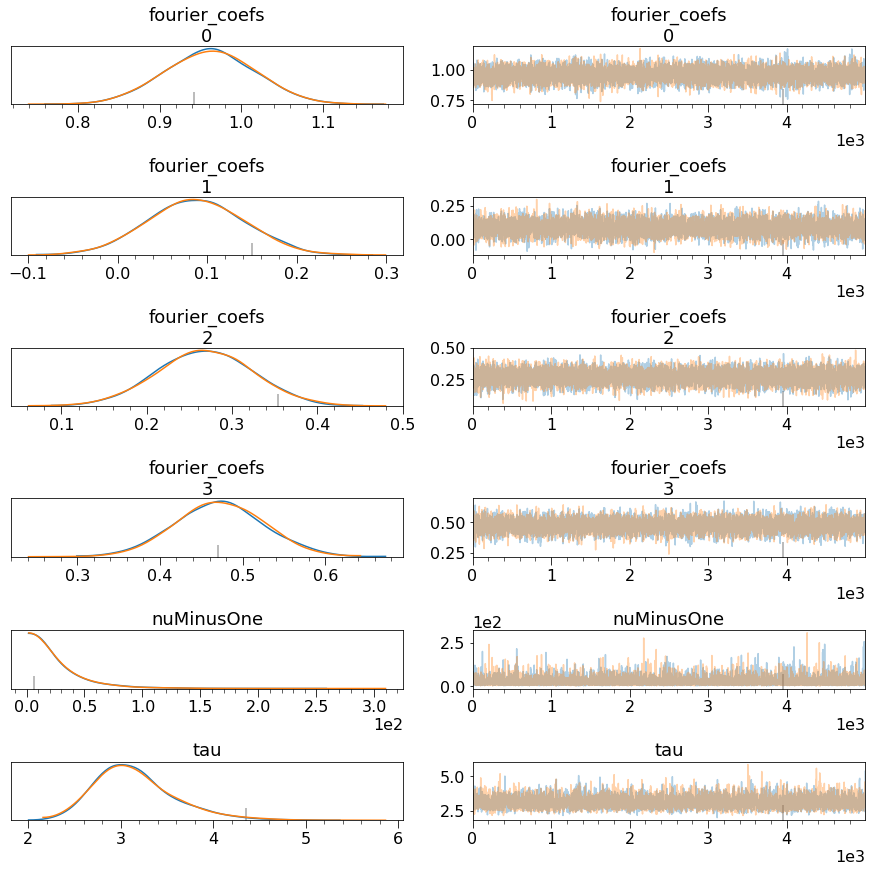

In [65]:
pm.traceplot(trace_m2f2);

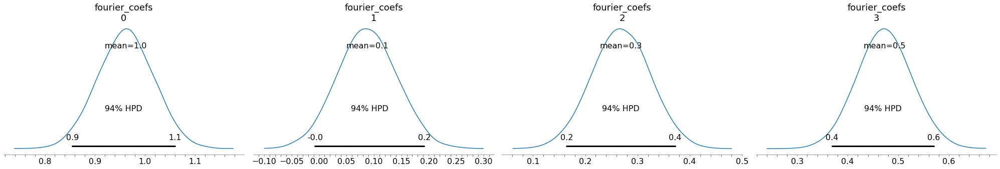

In [67]:
pm.plot_posterior(trace_m2f2, var_names=['fourier_coefs']);

In [68]:
N=5
wls = [2*np.pi *k / 12 for k in range(1, N+1)]
sinusoids = np.array([[np.cos(wli*x), np.sin(wli*x)] 
                      for wli in wls]).reshape(N*2, -1).T

with pm.Model() as m2_fourier_3:
    nuMinusOne = pm.Exponential('nuMinusOne', 1/29)
    nu_ = nuMinusOne + 1
    f_coefs = pm.Normal('fourier_coefs', 0, sd=1, shape=(N*2))
    season = tt.dot(sinusoids, f_coefs)
    tau = pm.Gamma('tau', 10, 2) 
    y_lik = pm.StudentT('y_lik', mu=season, lam=tau, nu=nu_, observed=y_s)

In [69]:
with m2_fourier_3:
    trace_m2f3 = pm.sample(5000, tune=5000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [tau, fourier_coefs, nuMinusOne]
Sampling 2 chains: 100%|██████████| 20000/20000 [00:18<00:00, 1099.29draws/s]
There was 1 divergence after tuning. Increase `target_accept` or reparameterize.


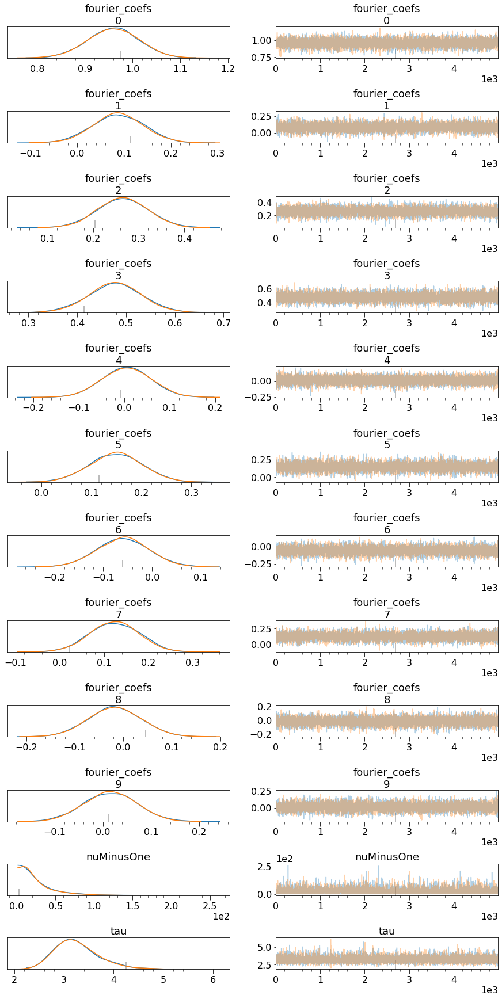

In [70]:
pm.traceplot(trace_m2f3);

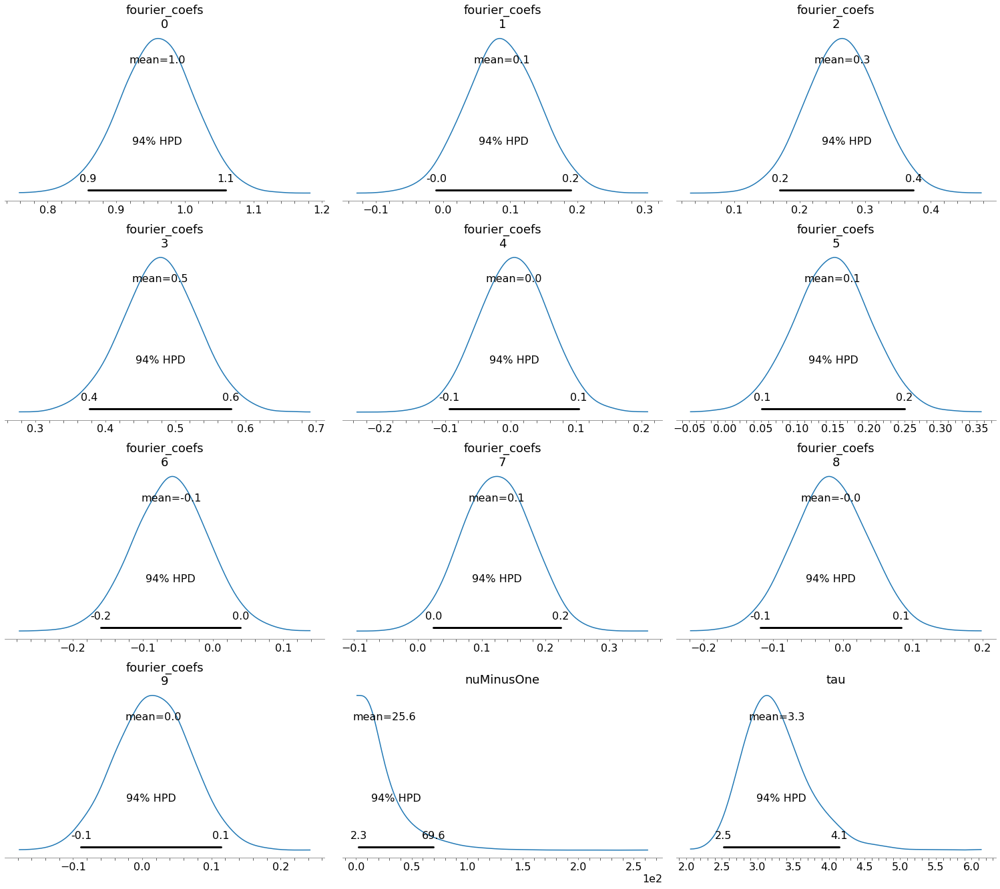

In [71]:
pm.plot_posterior(trace_m2f3);

In [72]:
N=10
wls = [2*np.pi *k / 12 for k in range(1, N+1)]
sinusoids = np.array([[np.cos(wli*x), np.sin(wli*x)] 
                      for wli in wls]).reshape(N*2, -1).T

with pm.Model() as m2_fourier_4:
    nuMinusOne = pm.Exponential('nuMinusOne', 1/29)
    nu_ = nuMinusOne + 1
    f_coefs = pm.Normal('fourier_coefs', 0, sd=1, shape=(N*2))
    season = tt.dot(sinusoids, f_coefs)
    tau = pm.Gamma('tau', 10, 2) 
    y_lik = pm.StudentT('y_lik', mu=season, lam=tau, nu=nu_, observed=y_s)

In [73]:
with m2_fourier_4:
    trace_m2f4 = pm.sample(5000, tune=5000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [tau, fourier_coefs, nuMinusOne]
Sampling 2 chains: 100%|██████████| 20000/20000 [03:07<00:00, 75.98draws/s] 


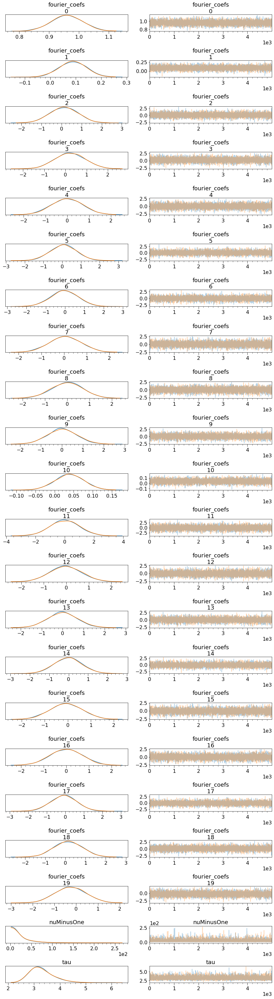

In [74]:
pm.traceplot(trace_m2f4);

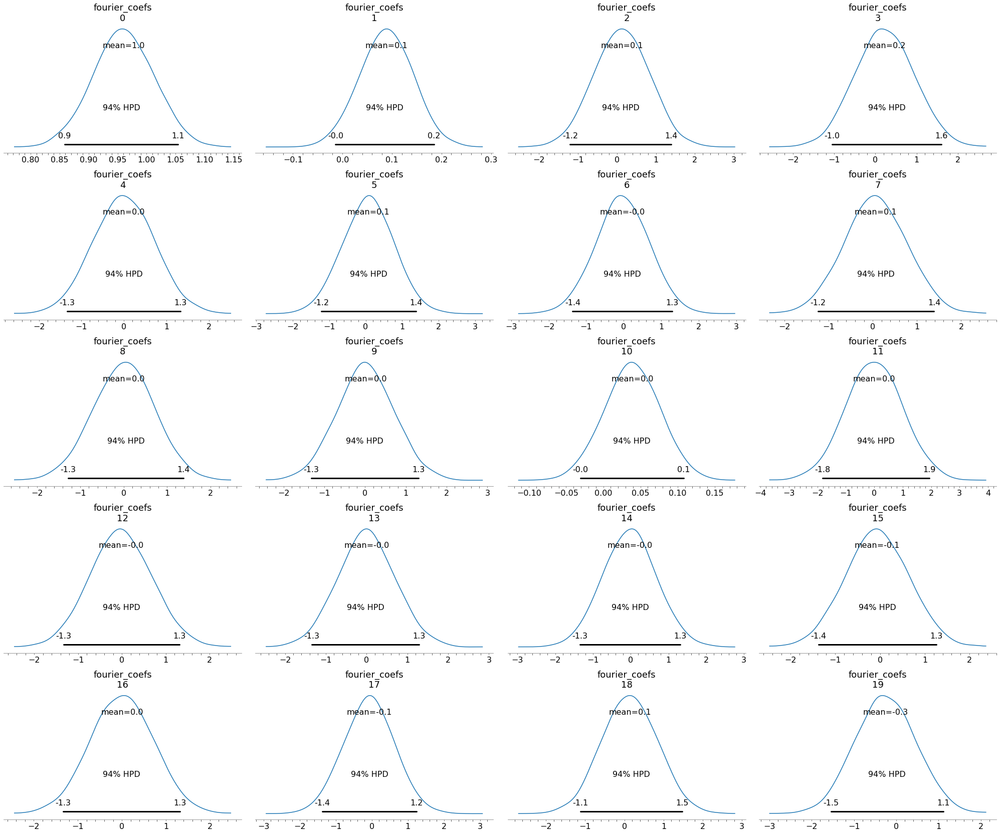

In [76]:
pm.plot_posterior(trace_m2f4, var_names=['fourier_coefs']);

In [77]:
N=1
wls = [2*np.pi *k / 12 for k in range(1, N+1)]
sinusoids = np.array([[np.cos(wli*x), np.sin(wli*x)] 
                      for wli in wls]).reshape(N*2, -1).T

with pm.Model() as m2_fourier_1:
    nuMinusOne = pm.Exponential('nuMinusOne', 1/29)
    nu_ = nuMinusOne + 1
    f_coefs = pm.Normal('fourier_coefs', 0, sd=1, shape=(N*2))
    season = tt.dot(sinusoids, f_coefs)
    tau = pm.Gamma('tau', 10, 2) 
    y_lik = pm.StudentT('y_lik', mu=season, lam=tau, nu=nu_, observed=y_s)

In [78]:
with m2_fourier_1:
    trace_m2f1 = pm.sample(5000, tune=5000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [tau, fourier_coefs, nuMinusOne]
Sampling 2 chains: 100%|██████████| 20000/20000 [00:16<00:00, 1196.86draws/s]


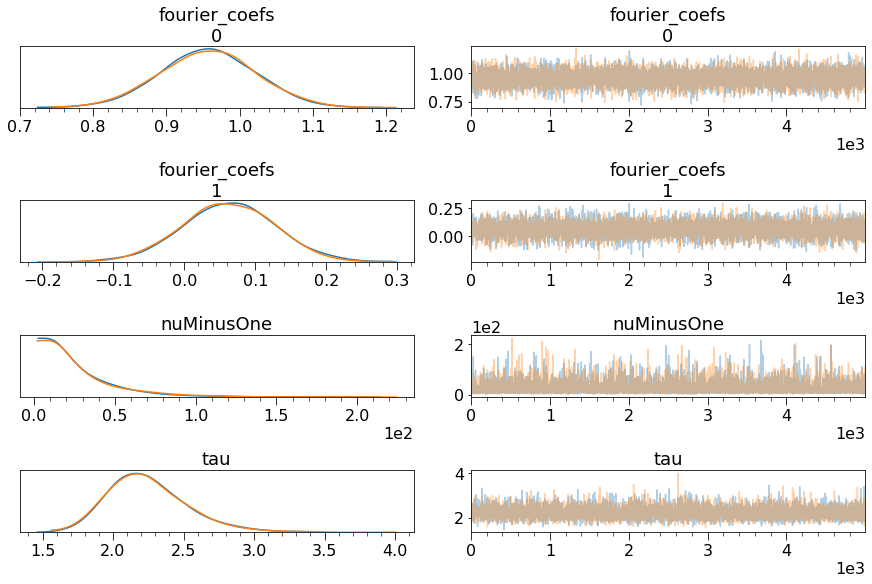

In [79]:
pm.traceplot(trace_m2f1);

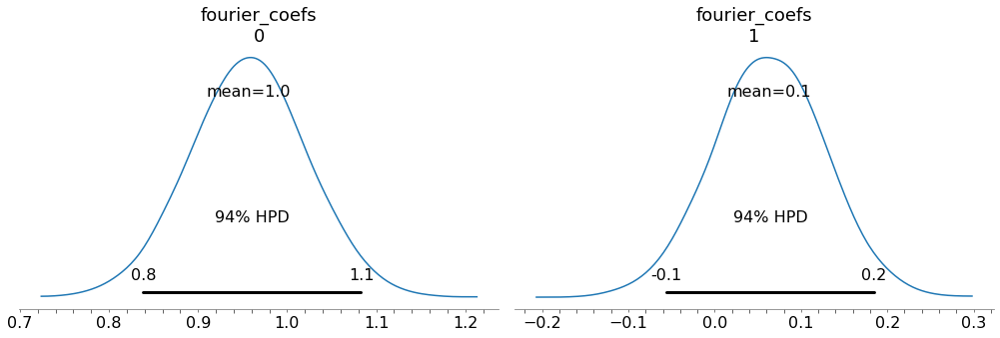

In [80]:
pm.plot_posterior(trace_m2f1, var_names=['fourier_coefs']);

In [81]:
m2_fourier_1.name = 'm_fourier_N1'
m2_fourier.name = 'm_fourier_N3'
m2_fourier_2.name = 'm_fourier_N2'
m2_fourier_3.name = 'm_fourier_N5'
m2_fourier_4.name = 'm_fourier_N10'
pm.compare({m2_fourier: trace_m2f, m2_fourier_2: trace_m2f2,
           m2_fourier_3: trace_m2f3, m2_fourier_4: trace_m2f4,
           m2_fourier_1: trace_m2f1})

/Users/erdemk/anaconda3/envs/bayesian_toa_project/lib/python3.7/site-packages/pymc3/stats.py:168: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  return np.stack(logp)


,WAIC,pWAIC,dWAIC,weight,SE,dSE,var_warn
m_fourier_N3,464.35,7.63,0,0.17,24.81,0,0
m_fourier_N5,465.67,11.64,1.32,0.44,24.91,5.51,0
m_fourier_N10,466.48,12.63,2.13,0.03,25.14,5.65,0
m_fourier_N2,467.54,5.46,3.19,0.35,24.8,5.23,0
m_fourier_N1,550.39,3.37,86.04,0,24.79,17.84,0


### Trend + Seasonality

In [82]:
with pm.Model() as m3:
    # seasonality
    thresh = pm.Uniform('thresh', -6, 6)
    amp = pm.Uniform('amp', 0, 1)
    season = pm.Deterministic('season', amp * tt.cos((x - thresh) / wl))
    
    slp = pm.Normal('slope', 0, 10)
    itc = pm.Normal('intercept', 0, 10)
    trend = pm.Deterministic('trend', itc + slp * x)
    
    # likelihood
    tau = pm.Gamma('tau', 10, 2)
    nuMinusOne = pm.Exponential('nuMinusOne', 1/29)
    nu_ = nuMinusOne + 1
    mu_ = trend + season
    y_lik = pm.StudentT('y_lik', mu=mu_, lam=tau, nu=nu_, observed=y_s)

In [83]:
with m3:
    trace_3 = pm.sample(5000, tune=5000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [nuMinusOne, tau, intercept, slope, amp, thresh]
Sampling 2 chains: 100%|██████████| 20000/20000 [00:33<00:00, 603.71draws/s]


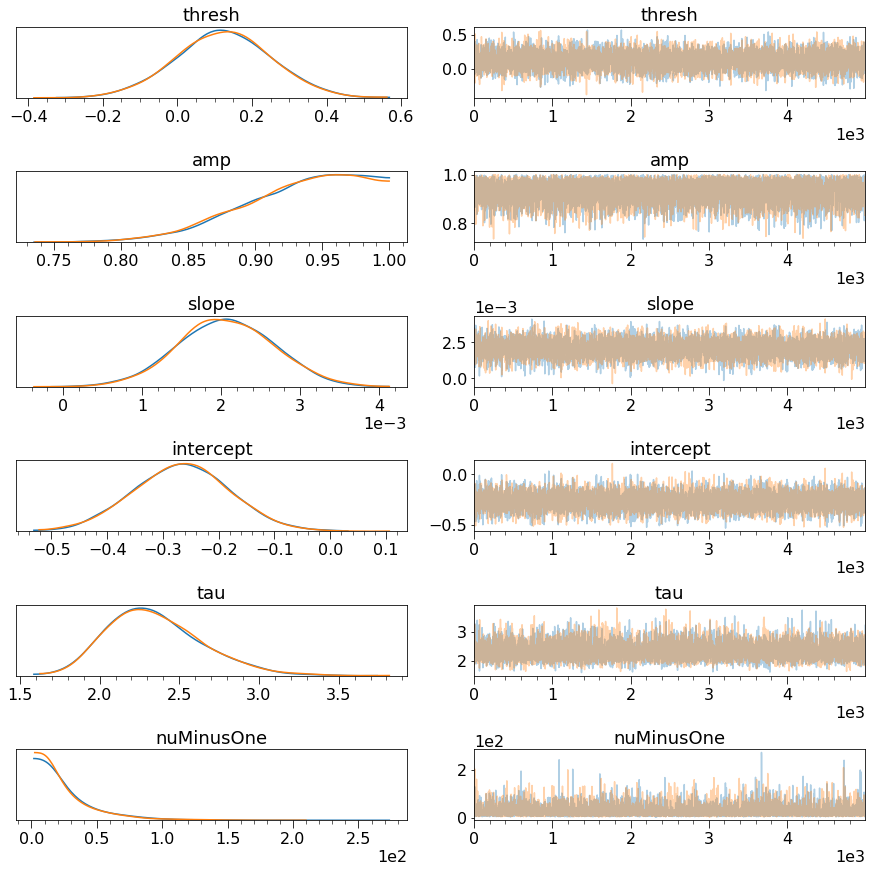

In [85]:
vars_ = ['thresh', 'amp', 'slope', 'intercept', 'tau', 'nuMinusOne']
pm.traceplot(trace_3, var_names=vars_);

#### <u>Simple trend and fourier seasonality</u>

In [86]:
N=1
wls = [2*np.pi *k / 12 for k in range(1, N+1)]
sinusoids = np.array([[np.cos(wli*x), np.sin(wli*x)] 
                      for wli in wls]).reshape(N*2, -1).T
with pm.Model() as m3_f1:
    # seasonality estimation
    f_coefs = pm.Normal('fourier_coefs', 0, sd=1, shape=(N*2))
    season = pm.Deterministic('season', tt.dot(sinusoids, f_coefs))
    
    
    # trend estimation
    slp = pm.Normal('slope', 0, 1)
    itc = pm.Normal('intercept', 0, 1)
    trend = pm.Deterministic('trend', itc + slp * x)
    
    
    nuMinusOne = pm.Exponential('nuMinusOne', 1/29)
    nu_ = nuMinusOne + 1
    lam_ = pm.Gamma('lam', 10, 2)
    mu_ = pm.Deterministic('mu', trend + season)
    y_lik = pm.StudentT('y_lik', mu=mu_, lam=lam_, nu=nu_, observed=y_s)

In [87]:
with m3_f1:
    trace_3f1 = pm.sample(5000, tune=5000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [lam, nuMinusOne, intercept, slope, fourier_coefs]
Sampling 2 chains: 100%|██████████| 20000/20000 [00:28<00:00, 696.20draws/s]


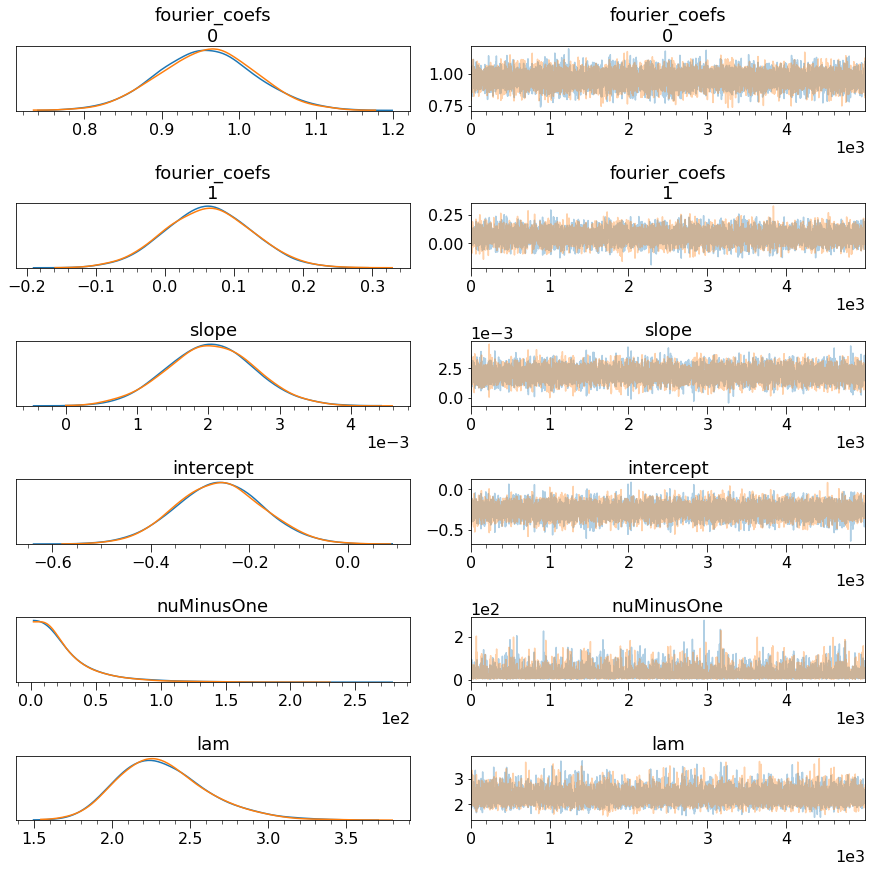

In [88]:
vars_ = ['fourier_coefs', 'slope', 'intercept', 'nuMinusOne', 'lam']
pm.traceplot(trace_3f1, var_names=vars_);

In [89]:
N=2
wls = [2*np.pi *k / 12 for k in range(1, N+1)]
sinusoids = np.array([[np.cos(wli*x), np.sin(wli*x)] 
                      for wli in wls]).reshape(N*2, -1).T
with pm.Model() as m3_f2:
    # seasonality estimation
    f_coefs = pm.Normal('fourier_coefs', 0, sd=1, shape=(N*2))
    season = pm.Deterministic('season', tt.dot(sinusoids, f_coefs))
    
    
    # trend estimation
    slp = pm.Normal('slope', 0, 1)
    itc = pm.Normal('intercept', 0, 1)
    trend = pm.Deterministic('trend', itc + slp * x)
    
    
    nuMinusOne = pm.Exponential('nuMinusOne', 1/29)
    nu_ = nuMinusOne + 1
    lam_ = pm.Gamma('lam', 10, 2)
    mu_ = pm.Deterministic('mu', trend + season)
    y_lik = pm.StudentT('y_lik', mu=mu_, lam=lam_, nu=nu_, observed=y_s)

In [90]:
with m3_f2:
    trace_3f2 = pm.sample(5000, tune=5000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [lam, nuMinusOne, intercept, slope, fourier_coefs]
Sampling 2 chains: 100%|██████████| 20000/20000 [00:30<00:00, 656.06draws/s]


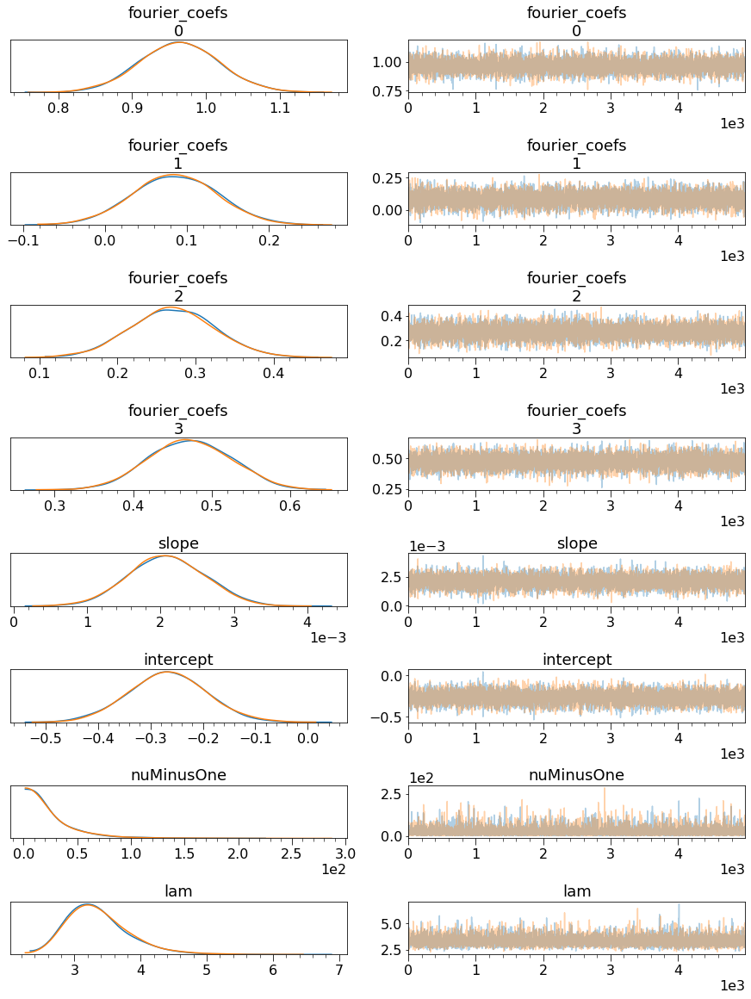

In [91]:
vars_ = ['fourier_coefs', 'slope', 'intercept', 'nuMinusOne', 'lam']
pm.traceplot(trace_3f2, var_names=vars_);

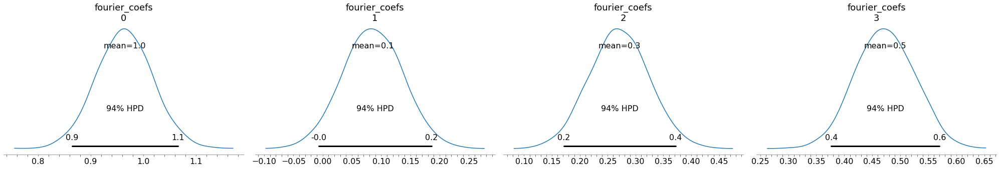

In [92]:
pm.plot_posterior(trace_3f2, var_names=['fourier_coefs']);

In [93]:
N=3
wls = [2*np.pi *k / 12 for k in range(1, N+1)]
sinusoids = np.array([[np.cos(wli*x), np.sin(wli*x)] 
                      for wli in wls]).reshape(N*2, -1).T
with pm.Model() as m3_f3:
    # seasonality estimation
    f_coefs = pm.Normal('fourier_coefs', 0, sd=1, shape=(N*2))
    season = pm.Deterministic('season', tt.dot(sinusoids, f_coefs))
    
    
    # trend estimation
    slp = pm.Normal('slope', 0, 1)
    itc = pm.Normal('intercept', 0, 1)
    trend = pm.Deterministic('trend', itc + slp * x)
    
    
    nuMinusOne = pm.Exponential('nuMinusOne', 1/29)
    nu_ = nuMinusOne + 1
    lam_ = pm.Gamma('lam', 10, 2)
    mu_ = pm.Deterministic('mu', trend + season)
    y_lik = pm.StudentT('y_lik', mu=mu_, lam=lam_, nu=nu_, observed=y_s)

In [94]:
with m3_f3:
    trace_3f3 = pm.sample(5000, tune=5000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [lam, nuMinusOne, intercept, slope, fourier_coefs]
Sampling 2 chains: 100%|██████████| 20000/20000 [00:31<00:00, 638.69draws/s]


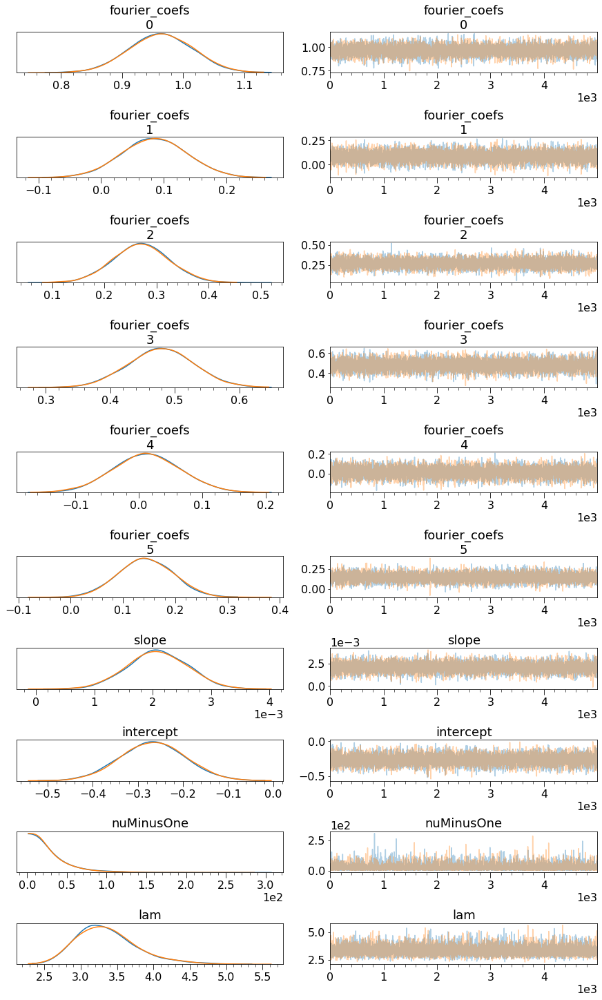

In [96]:
vars_ = ['fourier_coefs', 'slope', 'intercept', 'nuMinusOne', 'lam']
pm.traceplot(trace_3f3, var_names=vars_);

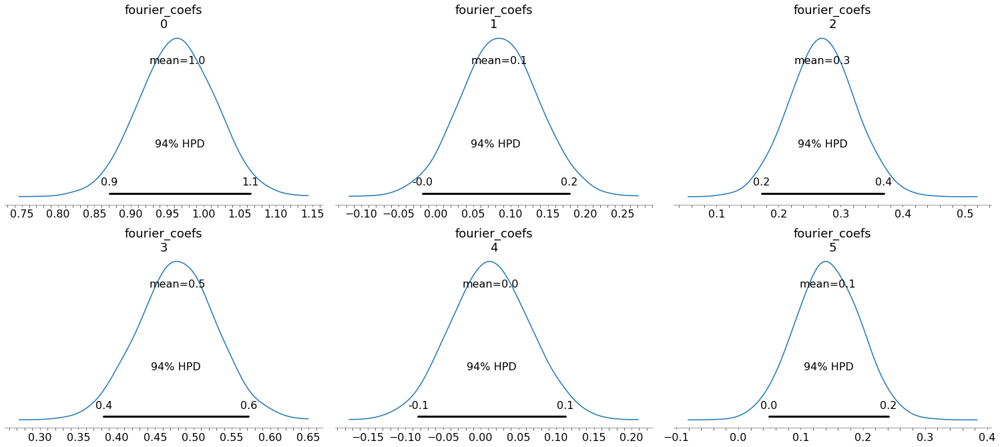

In [98]:
pm.plot_posterior(trace_3f3, var_names=['fourier_coefs']);

In [99]:
N=4
wls = [2*np.pi *k / 12 for k in range(1, N+1)]
sinusoids = np.array([[np.cos(wli*x), np.sin(wli*x)] 
                      for wli in wls]).reshape(N*2, -1).T
with pm.Model() as m3_f4:
    # seasonality estimation
    f_coefs = pm.Normal('fourier_coefs', 0, sd=1, shape=(N*2))
    season = pm.Deterministic('season', tt.dot(sinusoids, f_coefs))
    
    
    # trend estimation
    slp = pm.Normal('slope', 0, 1)
    itc = pm.Normal('intercept', 0, 1)
    trend = pm.Deterministic('trend', itc + slp * x)
    
    
    nuMinusOne = pm.Exponential('nuMinusOne', 1/29)
    nu_ = nuMinusOne + 1
    lam_ = pm.Gamma('lam', 10, 2)
    mu_ = pm.Deterministic('mu', trend + season)
    y_lik = pm.StudentT('y_lik', mu=mu_, lam=lam_, nu=nu_, observed=y_s)

In [100]:
with m3_f4:
    trace_3f4 = pm.sample(5000, tune=5000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [lam, nuMinusOne, intercept, slope, fourier_coefs]
Sampling 2 chains: 100%|██████████| 20000/20000 [00:31<00:00, 628.80draws/s]


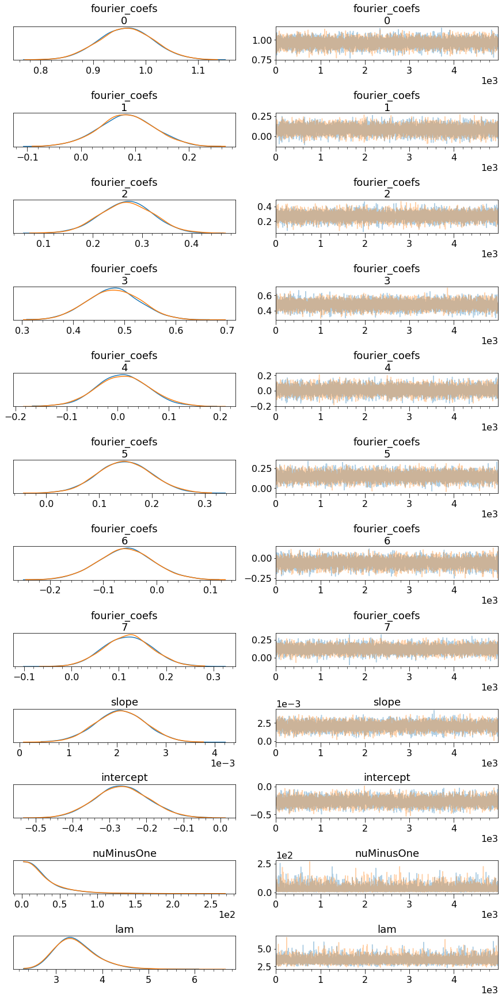

In [101]:
vars_ = ['fourier_coefs', 'slope', 'intercept', 'nuMinusOne', 'lam']
pm.traceplot(trace_3f4, var_names=vars_);

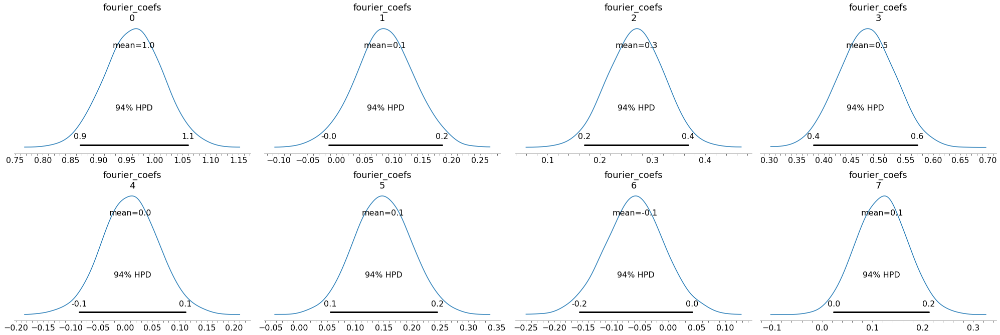

In [102]:
pm.plot_posterior(trace_3f4, var_names=['fourier_coefs']);

In [103]:
m3.name = 'm3_sin_season'
m3_f1.name ='m3_fourierN1'
m3_f2.name = 'm3_fourierN2'
m3_f3.name = 'm3_fourierN3'
m3_f4.name = 'm3_fourierN4'

In [104]:
pm.compare({m3: trace_3, m3_f1: trace_3f1, m3_f2: trace_3f2,
           m3_f3: trace_3f3, m3_f4: trace_3f4})

/Users/erdemk/anaconda3/envs/bayesian_toa_project/lib/python3.7/site-packages/pymc3/stats.py:168: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  return np.stack(logp)


,WAIC,pWAIC,dWAIC,weight,SE,dSE,var_warn
m3_fourierN4,448.37,11.42,0,0.69,24.49,0,0
m3_fourierN3,450.68,9.19,2.31,0,24.52,5.19,0
m3_fourierN2,454.79,7.33,6.42,0.31,24.89,8.21,0
m3_sin_season,542.13,4.63,93.76,0,24.99,18.54,0
m3_fourierN1,542.92,5.22,94.55,0,24.8,18.38,0


### Trend + Season + Residual

In [105]:
with pm.Model() as m4_normal:
    sd_ = pm.HalfCauchy('sd', 2.5)
    
    # seasonality estimation
    thresh = pm.Uniform('thresh', 0, 11)
    amp = pm.Uniform('amp', 0, 1)
    wl_ = pm.Uniform('wl', wl_lower, wl_upper)
    season = pm.Deterministic('season', amp * tt.cos((x - thresh)/ wl_))
    
    
    # trend estimation
    slp = pm.Normal('slope', 0, 1)
    itc = pm.Normal('intercept', 0, 1)
    trend = pm.Deterministic('trend', itc + slp * x)
    
    # residual estimation
    k_ = pm.Uniform('k', -1.1, 1.1)
    tau_ = pm.Gamma('tau', 10, 3)
    ar1 = pm.AR1('ar1', k=k_, tau_e=tau_, shape=y.size)
    #e_t = pm.Normal('e_t', 0, 1, shape=y.size)
    #mu_ = trend + season + e_t
    mu_ = pm.Deterministic('mu', trend + season + ar1)
    y_lik = pm.Normal('y_lik', mu=mu_, sd=sd_, observed=y_s)

In [107]:
render_m4_normal = pm.model_to_graphviz(m4_normal)
render_m4_normal.format='png'
render_m4_normal.render('m4_normal_graph', directory='../../figjar/')

'../../figjar/m4_normal_graph.png'

<img src='../../figjar/m4_normal_graph.png'>

In [108]:
with m4_normal:
    trace4_normal = pm.sample(7000, tune=10000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [ar1, tau, k, intercept, slope, wl, amp, thresh, sd]
Sampling 2 chains: 100%|██████████| 34000/34000 [04:52<00:00, 116.04draws/s]
There were 741 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.6388751698533173, but should be close to 0.8. Try to increase the number of tuning steps.
There were 2003 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.5365076008819711, but should be close to 0.8. Try to increase the number of tuning steps.
The gelman-rubin statistic is larger than 1.2 for some parameters.
The estimated number of effective samples is smaller than 200 for some parameters.


In [109]:
with pm.Model() as m4:
    # overall estimation
    nuMinusOne = pm.Exponential('nuMinusOne', 1/29)
    nu_ = nuMinusOne + 1
    lam_ = pm.Gamma('lam', 10, 2)
    
    # seasonality estimation
    thresh = pm.Uniform('thresh', 0, 11)
    amp = pm.Uniform('amp', 0, 1)
    wl_ = pm.Uniform('wl', wl_lower, wl_upper)
    season = pm.Deterministic('season', amp * tt.cos((x - thresh)/ wl_))
    
    
    # trend estimation
    slp = pm.Normal('slope', 0, 1)
    itc = pm.Normal('intercept', 0, 1)
    trend = pm.Deterministic('trend', itc + slp * x)
    
    # residual estimation
    k_ = pm.Uniform('k', -1.1, 1.1)
    tau_ = pm.Gamma('tau', 10, 3)
    ar1 = pm.AR1('ar1', k=k_, tau_e=tau_, shape=y.size)
    #e_t = pm.Normal('e_t', 0, 1, shape=y.size)
    #mu_ = trend + season + e_t
    mu_ = pm.Deterministic('mu', trend + season + ar1)
    y_lik = pm.StudentT('y_lik', mu=mu_, lam=lam_, nu=nu_, observed=y_s)

In [110]:
with m4:
    trace_4 = pm.sample(10000, tune=10000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [ar1, tau, k, intercept, slope, wl, amp, thresh, lam, nuMinusOne]
Sampling 2 chains: 100%|██████████| 40000/40000 [03:58<00:00, 167.63draws/s]
There were 60 divergences after tuning. Increase `target_accept` or reparameterize.
There were 35 divergences after tuning. Increase `target_accept` or reparameterize.
The number of effective samples is smaller than 25% for some parameters.


/Users/erdemk/anaconda3/envs/bayesian_toa_project/lib/python3.7/site-packages/arviz/plots/traceplot.py:156: SyntaxWarning: max_plots is smaller than the number of variables to plot generating only max_plots traceplots
  SyntaxWarning,


Error in callback <function install_repl_displayhook.<locals>.post_execute at 0x10f794e18> (for post_execute):


KeyboardInterrupt: 

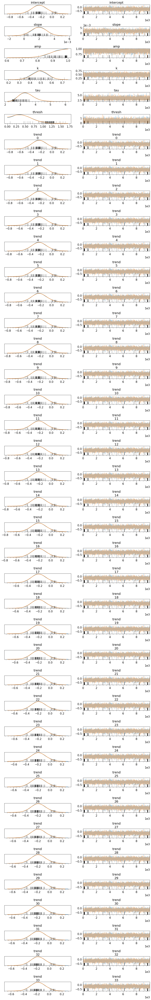

In [132]:
vars_ = ['intercept', 'slope', 'amp', 'k', 'tau', 'thresh', 'trend']
pm.traceplot(trace_4, var_names=vars_);

In [113]:
ts_mod_4 = trace_4.get_values('mu')
ts_mod_4_mu = ts_mod_4.mean(axis=0)
ts_mod_4_hpd = pm.hpd(ts_mod_4)
ts_mod_4_trend = trace_4.get_values('trend')
ts_mod_4_trend_mu = ts_mod_4_trend.mean(axis=0)
ts_mod_4_trend_hpd = pm.hpd(ts_mod_4_trend)
ts_mod_4_season = trace_4.get_values('season')
ts_mod_4_season_mu = ts_mod_4_season.mean(axis=0)
ts_mod_4_season_hpd = pm.hpd(ts_mod_4_season)
ts_mod_4_ar1 = trace_4.get_values('ar1')
ts_mod_4_ar1_mu = ts_mod_4_ar1.mean(axis=0)
ts_mod_4_ar1_hpd = pm.hpd(ts_mod_4_ar1)

In [114]:
def plot_component(axi, x, y, hpd_=None, obs=None, line_label=None, y_axis_label=None,
                  ax_title=None):
    
    if isinstance(obs, np.ndarray):
        axi.plot(x, obs, color='k', label='observations')
    axi.plot(x, y, color='darkblue', label=line_label)
    if isinstance(hpd_, np.ndarray):
        axi.fill_between(x, hpd_[:, 0], hpd_[:, 1], color='steelblue',
                         alpha=0.5, label='95% CI')
    if y_axis_label:
        axi.set_ylabel(y_axis_label)
    axi.legend()
    if ax_title:
        axi.set_title(ax_title)
    axi.xaxis_date()
    axi.xaxis.set_major_locator(years)
    axi.xaxis.set_minor_locator(months)
    axi.tick_params(axis='x', labelrotation=30)
    axi.grid()

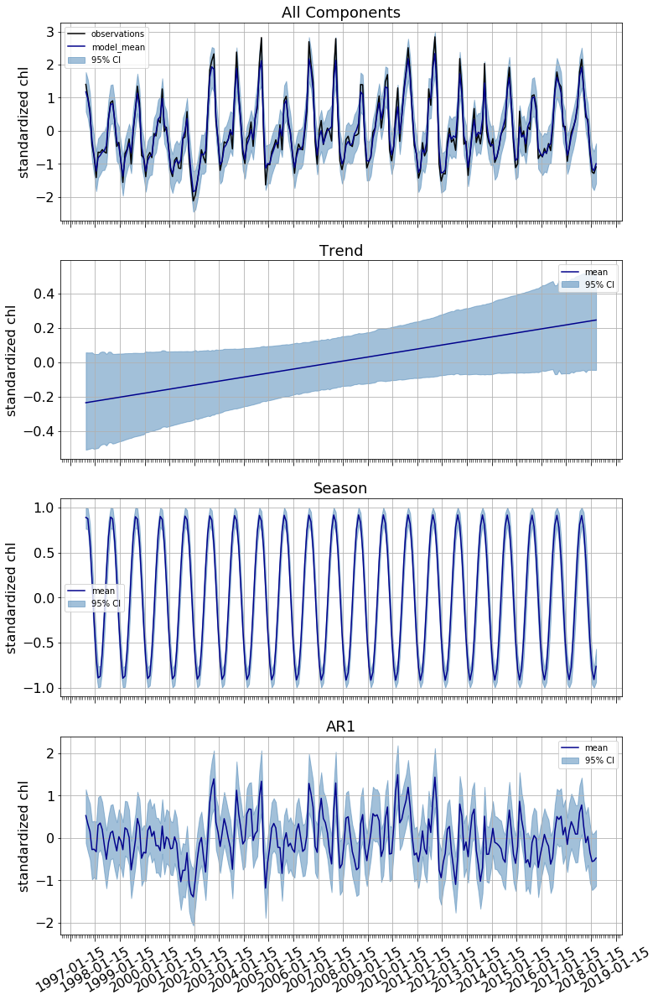

In [116]:
f, ax = pl.subplots(nrows=4, sharex=True, figsize=(12, 20))

ylbl = 'standardized chl'
plot_component(ax[0], d_aostz.index, ts_mod_4_mu, hpd_=ts_mod_4_hpd,
               obs=y_s, line_label='model_mean', y_axis_label=ylbl,
               ax_title='All Components')
plot_component(ax[1], d_aostz.index, ts_mod_4_trend_mu, hpd_=ts_mod_4_trend_hpd,
               line_label='mean', y_axis_label=ylbl, ax_title='Trend')
plot_component(ax[2], d_aostz.index, ts_mod_4_season_mu, hpd_=ts_mod_4_season_hpd,
               line_label='mean', y_axis_label=ylbl,
              ax_title='Season')
plot_component(ax[3], d_aostz.index, ts_mod_4_ar1_mu, hpd_=ts_mod_4_ar1_hpd,
              line_label='mean', y_axis_label=ylbl, ax_title='AR1')

#### Inverse transform results of models where standardized data was used

In [117]:
mod4_mu_us = std_scaler.inverse_transform(ts_mod_4_mu)
mod4_hpd_us = std_scaler.inverse_transform(ts_mod_4_hpd)
mod4_trend_hpd_us = std_scaler.inverse_transform(ts_mod_4_trend_hpd)
mod4_trend_mu_us = std_scaler.inverse_transform(ts_mod_4_trend_mu)
mod4_season_hpd_us = std_scaler.inverse_transform(ts_mod_4_season_hpd)
mod4_season_mu_us = std_scaler.inverse_transform(ts_mod_4_season_mu)
mod4_ar1_hpd_us = std_scaler.inverse_transform(ts_mod_4_ar1_hpd)
mod4_ar1_mu_us = std_scaler.inverse_transform(ts_mod_4_ar1_mu)

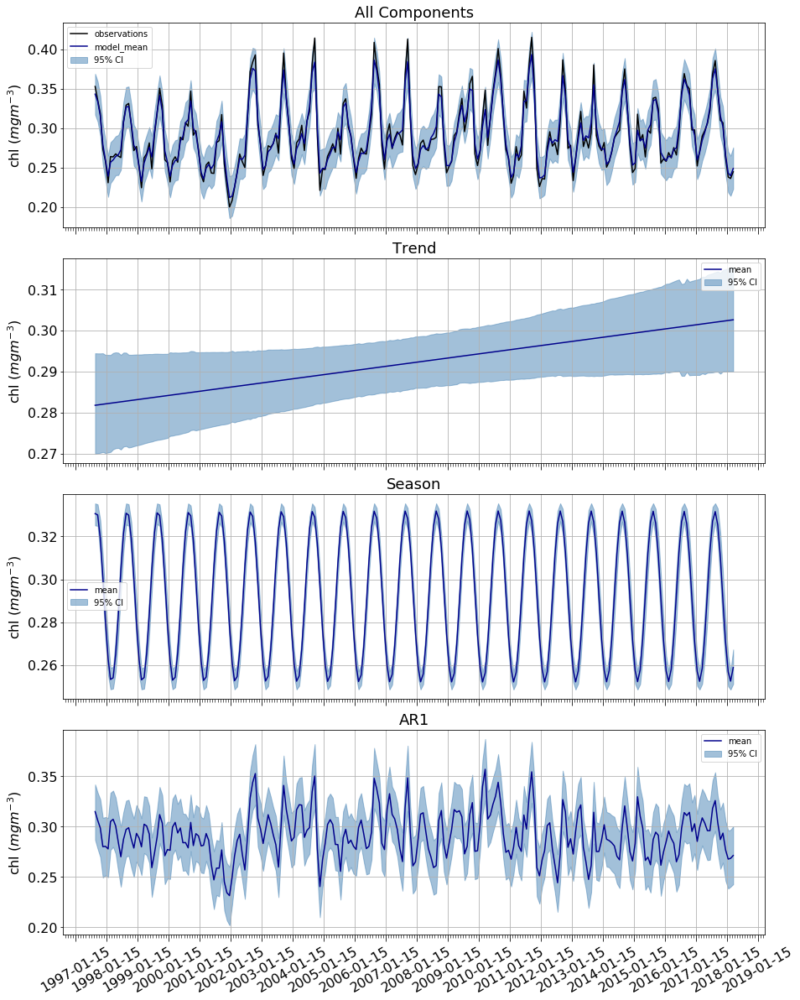

In [120]:
f, ax = pl.subplots(nrows=4, sharex=True, figsize=(15, 20))
plot_component(ax[0], d_aostz.index, mod4_mu_us, hpd_=mod4_hpd_us,
               obs=y, line_label='model_mean',
               y_axis_label='chl $(mg m^{-3})$', ax_title='All Components')
plot_component(ax[1], d_aostz.index, mod4_trend_mu_us, hpd_=mod4_trend_hpd_us,
               line_label='mean', y_axis_label='chl $(mg m^{-3})$',
              ax_title='Trend')
plot_component(ax[2], d_aostz.index, mod4_season_mu_us, hpd_=mod4_season_hpd_us,
               line_label='mean', y_axis_label='chl $(mg m^{-3})$',
              ax_title='Season')
plot_component(ax[3], d_aostz.index, mod4_ar1_mu_us, hpd_=mod4_ar1_hpd_us,
              line_label='mean', y_axis_label='chl $(mg m^{-3})$', ax_title='AR1')
f.subplots_adjust(hspace=0.15)

In [121]:
pm.summary(trace_4, var_names=vars_)

,mean,sd,mc_error,hpd_2.5,hpd_97.5,n_eff,Rhat
intercept,-0.235627,0.143825,0.003040,-0.508702,0.056463,2213.325831,1.000190
slope,0.001943,0.001017,0.000020,-0.000068,0.003934,2309.361144,1.000022
amp,0.923157,0.056201,0.000812,0.815722,0.999994,5024.418309,1.000534
k,0.489240,0.070586,0.000899,0.353786,0.629992,5713.613825,1.001168
tau,3.426348,0.493778,0.007132,2.507752,4.396493,5060.550056,1.000032
thresh,0.442741,0.278891,0.005672,0.000062,0.966938,2087.077726,1.000229
wl,1.905675,0.003887,0.000069,1.897961,1.913024,2810.873374,1.000813


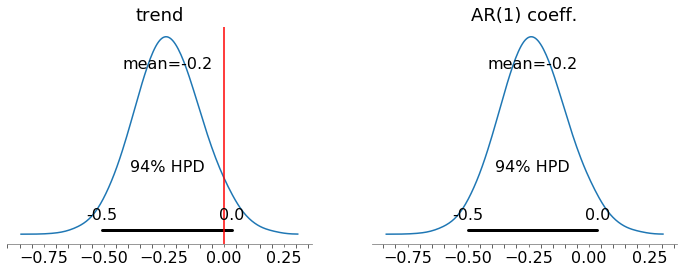

In [131]:
f, axs = pl.subplots(ncols=2, figsize=(12, 4))
pm.plot_posterior(trace_4, var_names=['trend', 'k'], ax=axs, text_size=16, );
axs[0].set_title('trend')
axs[0].axvline(color='r')
axs[1].set_title('AR(1) coeff.');
#f.savefig('./figJar/model4_posterior_dists.png', dpi=300)

In [125]:
with pm.Model() as m5:
    # overall estimation
    nuMinusOne = pm.Exponential('nuMinusOne', 1/29)
    nu_ = nuMinusOne + 1
    lam_ = pm.Gamma('lam', 10, 2)
    
    # seasonality estimation
    phase = pm.DiscreteUniform('phase', 0, 11, shape=2)
    amp = pm.HalfNormal('amp', 5, shape=2)
    cycle_1 = pm.Uniform('cycle_1', 11, 13)
    cycle_2 = pm.Uniform('cycle_2', 5, 7)
    season_1 = amp[0] * tt.cos((2 * PI * x / cycle_1) - phase[0])
    season_2 = amp[1] * tt.cos((2 * PI * x / cycle_2) - phase[1])
    season = pm.Deterministic('season', season_1 + season_2)
    
    # trend estimation
    slp = pm.Normal('slope', 0, 1)
    itc = pm.Normal('intercept', 0, 1)
    trend = pm.Deterministic('trend', itc + slp * x)
       
    # residual estimation
    k_ = pm.Uniform('k', -1.1, 1.1)
    tau_ = pm.Gamma('tau', 10, 3)
    ar1 = pm.AR1('ar1', k=k_, tau_e=tau_, shape=y.size)

    #e_t = pm.Normal('e_t', 0, 1, shape=y.size)
    #mu_ = trend + season + e_t
    mu_ = pm.Deterministic('mu_', trend + season + ar1)
    y_lik = pm.StudentT('y_lik', mu=mu_, lam=lam_, nu=nu_, observed=y_s)    

In [126]:
with m5:
    trace_5 = pm.sample(10000, tune=10000)

Multiprocess sampling (2 chains in 2 jobs)
CompoundStep
>NUTS: [ar1, tau, k, intercept, slope, cycle_2, cycle_1, amp, lam, nuMinusOne]
>Metropolis: [phase]
Sampling 2 chains: 100%|██████████| 40000/40000 [05:14<00:00, 127.09draws/s]
The acceptance probability does not match the target. It is 0.8932387184013946, but should be close to 0.8. Try to increase the number of tuning steps.
The gelman-rubin statistic is larger than 1.4 for some parameters. The sampler did not converge.
The estimated number of effective samples is smaller than 200 for some parameters.


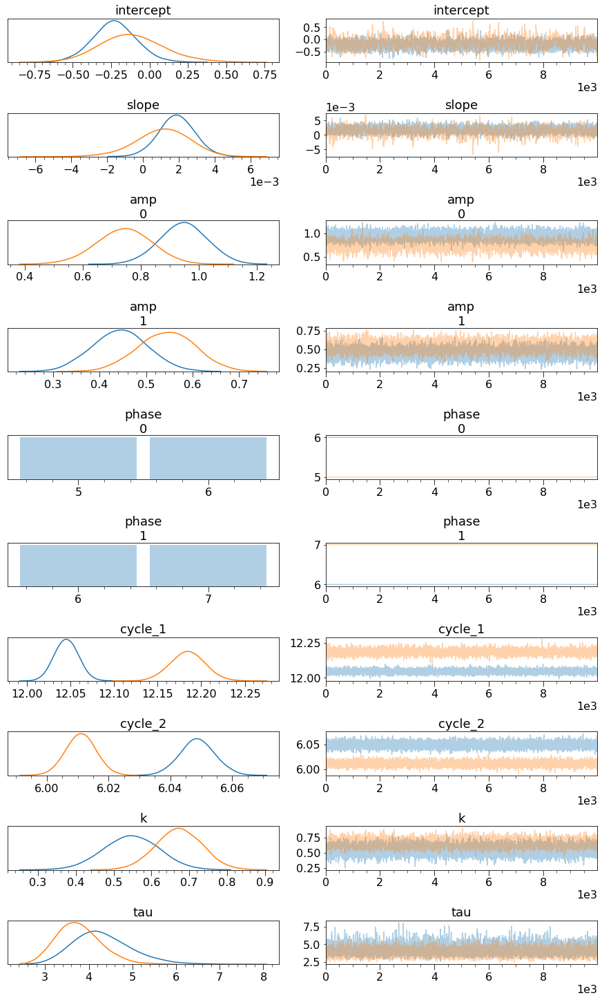

In [127]:
vars_ = ['intercept', 'slope', 'amp', 'phase', 'cycle_1' ,'cycle_2', 'k', 'tau']
pm.traceplot(trace_5, var_names=vars_);

In [178]:
dft5 = pm.summary(trace_5)

In [180]:
dft5.loc[dft5.Rhat>=1.4]

,mean,sd,mc_error,hpd_2.5,hpd_97.5,n_eff,Rhat
phase,3.239477,2.731951,0.272014,1.169907,8.239232,2.013667,12.367996


In [65]:
ts_mod_5 = trace_5.get_values('mu_')
ts_mod_5_mu = ts_mod_5.mean(axis=0)
ts_mod_5_hpd = pm.hpd(ts_mod_5)
ts_mod_5_trend = trace_5.get_values('trend')
ts_mod_5_trend_mu = ts_mod_5_trend.mean(axis=0)
ts_mod_5_trend_hpd = pm.hpd(ts_mod_5_trend)
ts_mod_5_season = trace_5.get_values('season')
ts_mod_5_season_mu = ts_mod_5_season.mean(axis=0)
ts_mod_5_season_hpd = pm.hpd(ts_mod_5_season)
ts_mod_5_ar1 = trace_5.get_values('ar1')
ts_mod_5_ar1_mu = ts_mod_5_ar1.mean(axis=0)
ts_mod_5_ar1_hpd = pm.hpd(ts_mod_5_ar1)

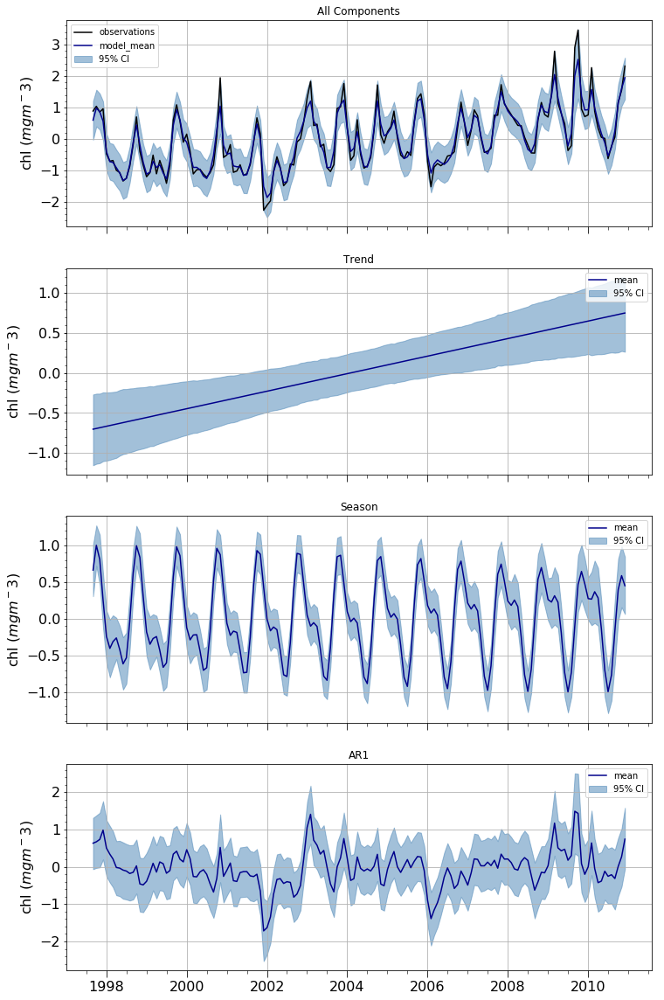

In [71]:
mod5_mu_us = std_scaler.inverse_transform(ts_mod_5_mu)
mod5_hpd_us = std_scaler.inverse_transform(ts_mod_5_hpd)
mod5_trend_hpd_us = std_scaler.inverse_transform(ts_mod_5_trend_hpd)
mod5_trend_mu_us = std_scaler.inverse_transform(ts_mod_5_trend_mu)
mod5_season_hpd_us = std_scaler.inverse_transform(ts_mod_5_season_hpd)
mod5_season_mu_us = std_scaler.inverse_transform(ts_mod_5_season_mu)
mod5_ar1_hpd_us = std_scaler.inverse_transform(ts_mod_5_ar1_hpd)
mod5_ar1_mu_us = std_scaler.inverse_transform(ts_mod_5_ar1_mu)
f, ax = pl.subplots(nrows=4, sharex=True, figsize=(12, 20))
plot_component(ax[0], d_iostz.index, ts_mod_5_mu, hpd_=ts_mod_5_hpd,
               obs=y_s, line_label='model_mean',
               y_axis_label='chl $(mg m^-3)$', ax_title='All Components')
plot_component(ax[1], d_iostz.index, ts_mod_5_trend_mu, hpd_=ts_mod_5_trend_hpd,
               line_label='mean', y_axis_label='chl $(mg m^-3)$',
              ax_title='Trend')
plot_component(ax[2], d_iostz.index, ts_mod_5_season_mu, hpd_=ts_mod_5_season_hpd,
               line_label='mean', y_axis_label='chl $(mg m^-3)$',
              ax_title='Season')
plot_component(ax[3], d_iostz.index, ts_mod_5_ar1_mu, hpd_=ts_mod_5_ar1_hpd,
              line_label='mean', y_axis_label='chl $(mg m^-3)$', ax_title='AR1')

In [69]:
pm.summary(trace_5, var_names=vars_)

,mean,sd,mc_error,hpd_2.5,hpd_97.5,n_eff,Rhat
intercept,-0.702773,0.226080,0.003271,-1.155062,-0.269016,4582.773666,1.000160
slope,0.009147,0.002464,0.000033,0.004332,0.014028,4829.893189,1.000418
amp__0,0.667671,0.110026,0.001155,0.450880,0.884505,8872.234845,1.000059
amp__1,0.393080,0.079475,0.000726,0.235134,0.549326,15881.738046,1.000081
thresh1,10.480064,0.469853,0.004725,9.573454,11.410631,12139.127125,1.000228
thresh2,11.552481,0.319111,0.002500,10.936431,12.193348,17125.299113,1.000086
wl_1,1.941707,0.011422,0.000106,1.919245,1.964353,11516.422607,1.000208
wl_2,0.955897,0.003947,0.000034,0.948013,0.963453,15734.391590,1.000164


#### Modeling w/ missing data imputation

In [126]:
df[['IOSTZ']].resample('MS').mean().info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 160 entries, 1997-09-01 to 2010-12-01
Freq: MS
Data columns (total 1 columns):
IOSTZ    155 non-null float64
dtypes: float64(1)
memory usage: 2.5 KB


In [144]:
y_w_nan = np.ma.array(data=df.IOSTZ.resample('MS').mean(),
                      mask=df.IOSTZ.resample('MS').mean().isnull(),
                     fill_value=-999)
nan_scaler = namedtuple('nan_scaler', ['mean_', 'std_'])
nan_scaler.mean_ = y_w_nan.mean()
nan_scaler.std_ = y_w_nan.std()
y_w_nan_s = (y_w_nan - nan_scaler.mean_) / nan_scaler.std_

In [146]:
with pm.Model() as m4i:
    """This model includes missing data imputation"""
    # overall estimation
    nuMinusOne = pm.Exponential('nuMinusOne', 1/29)
    nu_ = nuMinusOne + 1
    lam_ = pm.Gamma('lam', 10, 2)
    
    # seasonality estimation
    thresh = pm.Uniform('thresh', 0, 11)
    amp = pm.Uniform('amp', 0, 1)
    wl_ = pm.Uniform('wl', wl_lower, wl_upper)
    season = pm.Deterministic('season', amp * tt.cos((x - thresh)/ wl_))
    
    
    # trend estimation
    slp = pm.Normal('slope', 0, 1)
    itc = pm.Normal('intercept', 0, 1)
    trend = pm.Deterministic('trend', itc + slp * x)
    
    # residual estimation
    k_ = pm.Uniform('k', -1.1, 1.1)
    tau_ = pm.Gamma('tau', 10, 3)
    ar1 = pm.AR1('ar1', k=k_, tau_e=tau_, shape=y.size)
    #e_t = pm.Normal('e_t', 0, 1, shape=y.size)
    #mu_ = trend + season + e_t
    mu_ = pm.Deterministic('mu', trend + season + ar1)
    y_lik = pm.StudentT('y_lik', mu=mu_, lam=lam_, nu=nu_, observed=y_w_nan_s)

In [147]:
with m4i:
    trace_4i = pm.sample(10000, tune=10000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [y_lik_missing, ar1, tau_log__, k_interval__, intercept, slope, wl_interval__, amp_interval__, thresh_interval__, lam_log__, nuMinusOne_log__]
100%|██████████| 20000/20000 [03:02<00:00, 109.84it/s]
There were 14 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.69781933688, but should be close to 0.8. Try to increase the number of tuning steps.
There were 13 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.71646233209, but should be close to 0.8. Try to increase the number of tuning steps.
There were 3 divergences after tuning. Increase `target_accept` or reparameterize.
The number of effective samples is smaller than 10% for some parameters.


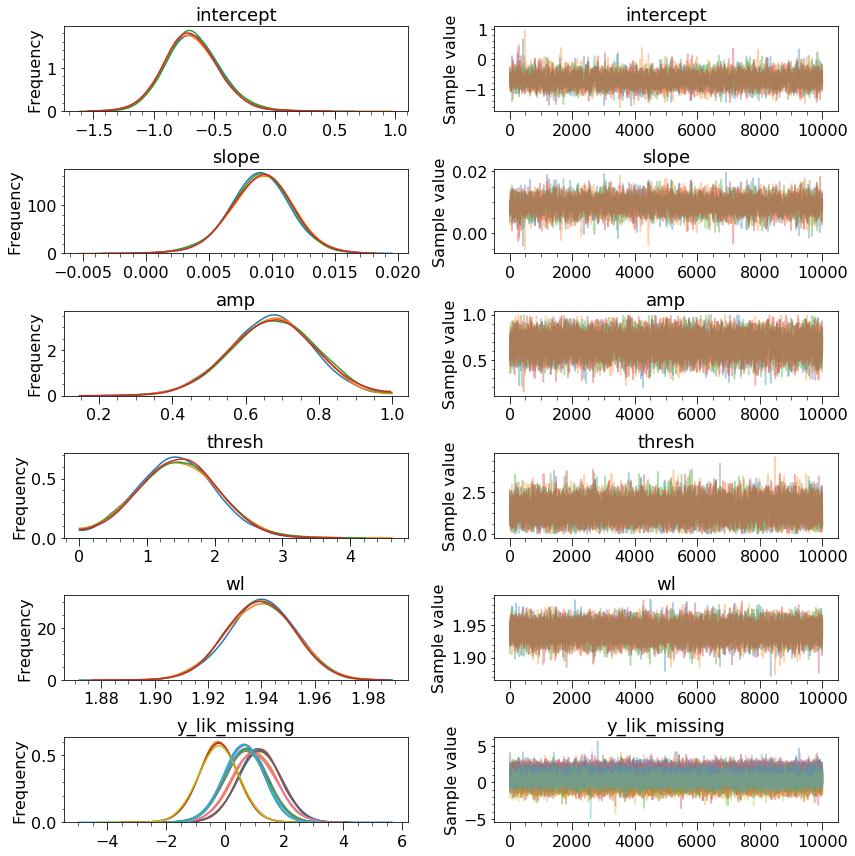

In [243]:
vars_ = ['intercept', 'slope', 'amp', 'thresh', 'wl', 'y_lik_missing']
pm.traceplot(trace_4i, varnames=vars_);

In [244]:
pm.summary(trace_4i, varnames=vars_)

,mean,sd,mc_error,hpd_2.5,hpd_97.5,n_eff,Rhat
intercept,-0.678875,0.224528,0.004561,-1.112781,-0.228108,3116.003596,1.000485
slope,0.009113,0.002447,0.000046,0.004178,0.013920,3576.453879,1.000292
amp,0.672759,0.114928,0.001340,0.441977,0.892130,7069.847140,1.000799
thresh,1.447370,0.584646,0.006425,0.289872,2.574037,8414.914112,1.000438
wl,1.939780,0.012613,0.000140,1.915247,1.964524,8984.735723,1.000503
y_lik_missing__0,1.166311,0.710226,0.004355,-0.219344,2.560616,23333.505362,1.000090
y_lik_missing__1,0.977485,0.743502,0.004838,-0.492352,2.421179,21163.169051,1.000011
y_lik_missing__2,0.711867,0.707809,0.004417,-0.682458,2.093423,21569.211968,1.000060
y_lik_missing__3,-0.222968,0.656253,0.003800,-1.539396,1.040424,30058.771240,1.000005
y_lik_missing__4,0.637990,0.663471,0.003682,-0.668910,1.927358,32088.705741,0.999994


In [192]:
d_iostz_s = (df.IOSTZ  - df.IOSTZ.mean()) / df.IOSTZ.std()
d_iostz_si = d_iostz_s.resample('MS').mean().interpolate()

In [198]:
np.argwhere(y_w_nan_s.mask)

array([[124],
       [125],
       [126],
       [130],
       [140]])

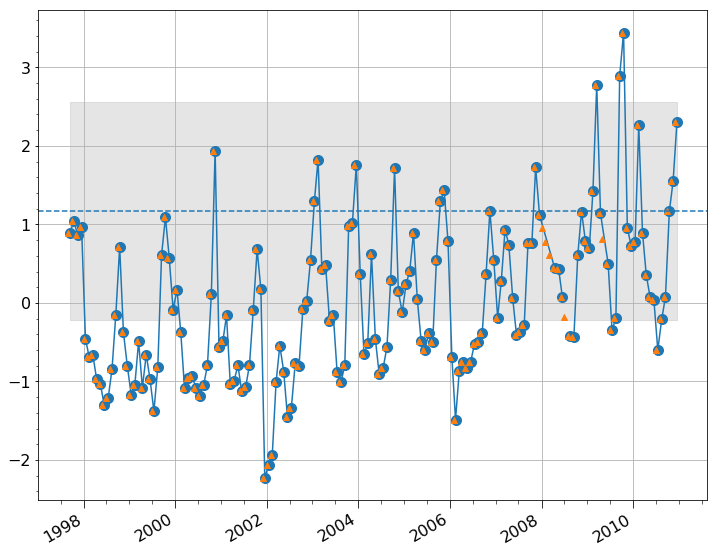

In [202]:
_, ax = pl.subplots(figsize=(12, 10))

d_iostz_s.plot(marker='o', markersize=10, ax=ax)
d_iostz_si.plot(marker='^', ls='', ax=ax)
ax.grid()
ax.axhline(y=1.166, ls='--')
ax.fill_between(d_iostz_s.index, y1=-0.219, y2=2.561, color='gray', alpha=0.2)

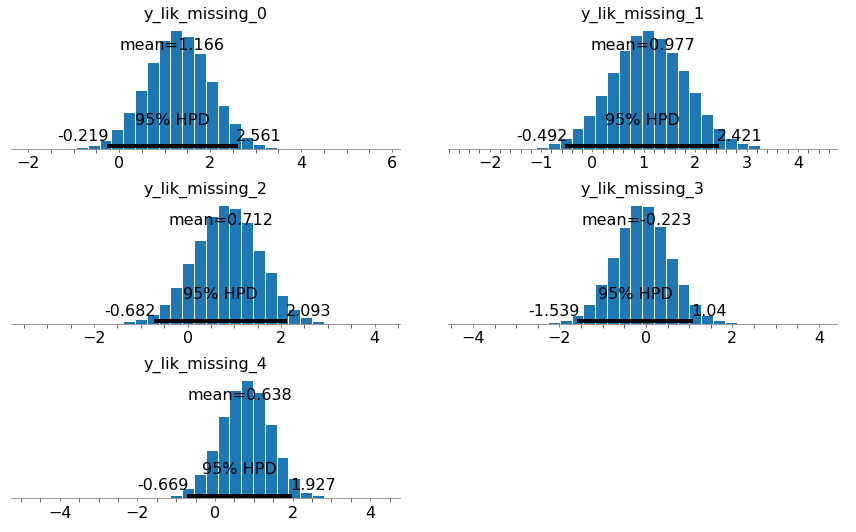

In [185]:
pm.plot_posterior(trace_4i, varnames=['y_lik_missing'],text_size=16);

In [166]:
with pm.Model() as m5i:
    # overall estimation
    nuMinusOne = pm.Exponential('nuMinusOne', 1/29)
    nu_ = nuMinusOne + 1
    lam_ = pm.Gamma('lam', 10, 2)
    
    # seasonality estimation
    thresh = pm.Normal('thresh', 10, shape=2)
    amp = pm.HalfNormal('amp', 5, shape=2)
    wl = pm.Uniform('wl_1', 0, 5, shape=2)
    season_1 = amp[0] * tt.sin((x - thresh[0]) / wl[0])
    season_2 = amp[1] * tt.sin((x - thresh[1]) / wl[1])
    season = pm.Deterministic('season', season_1 + season_2)
    
    # trend estimation
    slp = pm.Normal('slope', 0, 1)
    itc = pm.Normal('intercept', 0, 1)
    trend = pm.Deterministic('trend', itc + slp * x)
       
    # residual estimation
    k_ = pm.Uniform('k', -1.1, 1.1)
    tau_ = pm.Gamma('tau', 10, 3)
    ar1 = pm.AR1('ar1', k=k_, tau_e=tau_, shape=y.size)

    #e_t = pm.Normal('e_t', 0, 1, shape=y.size)
    #mu_ = trend + season + e_t
    mu_ = pm.Deterministic('mu_', trend + season + ar1)
    y_lik = pm.StudentT('y_lik', mu=mu_, lam=lam_, nu=nu_, observed=y_w_nan_s)    

In [162]:
with m5i:
    trace_5i = pm.sample(10000, tune=10000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [y_lik_missing, ar1, tau_log__, k_interval__, intercept, slope, wl_2_interval__, wl_1_interval__, amp_log__, thresh2, thresh1, lam_log__, nuMinusOne_log__]
100%|██████████| 20000/20000 [04:49<00:00, 69.07it/s]
There were 2 divergences after tuning. Increase `target_accept` or reparameterize.
The gelman-rubin statistic is larger than 1.4 for some parameters. The sampler did not converge.
The estimated number of effective samples is smaller than 200 for some parameters.


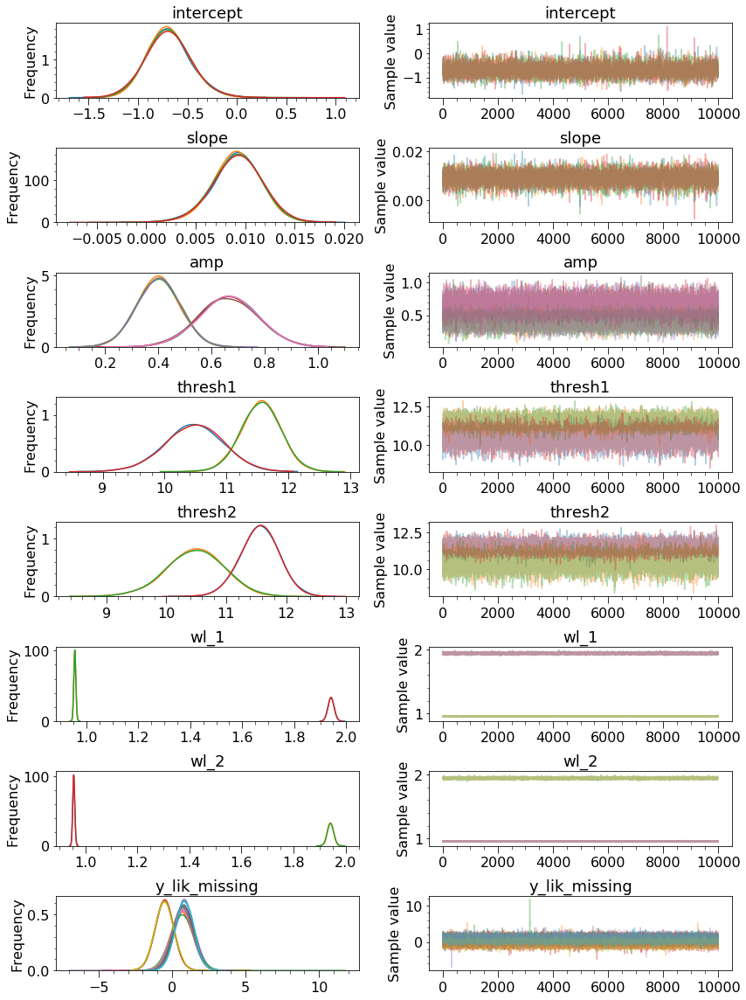

In [165]:
vars_ = ['intercept', 'slope', 'amp', 'thresh1', 'thresh2', 'wl_1', 'wl_2',
         'y_lik_missing']
pm.traceplot(trace_5i, varnames=vars_);

### Local linear  modeling

In [217]:
numobs = y_s.size

In [219]:
with pm.Model() as m6:
    delta_t = pm.GaussianRandomWalk('delta_t', mu=0, sd=1, shape=numobs)
    y_t = pm.Normal('y_t', mu=delta_t, sd=1, observed=y_s)

In [220]:
with m6:
    trace_6 = pm.sample(5000, tune=5000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [delta_t]
100%|██████████| 10000/10000 [00:23<00:00, 425.11it/s]


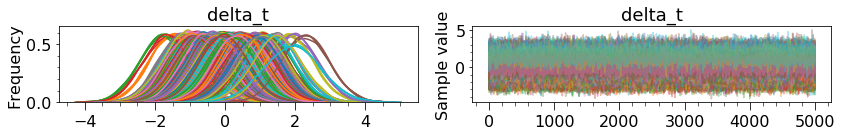

In [223]:
pm.traceplot(trace_6);

In [227]:
y_ppc6 = pm.sample_ppc(trace_6, model=m6)['y_t']

100%|██████████| 5000/5000 [00:00<00:00, 6327.71it/s]


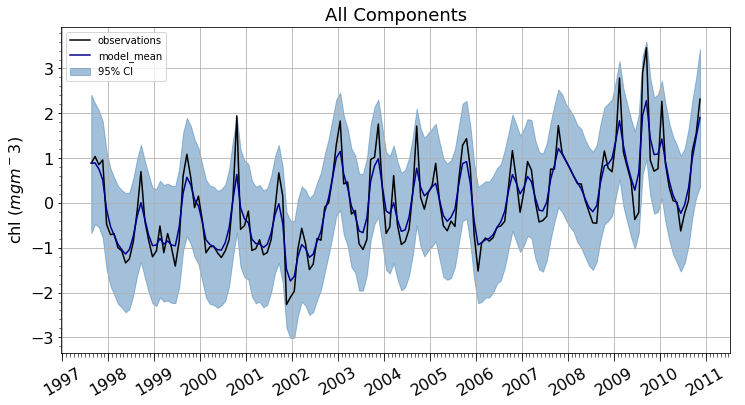

In [222]:
ts_mod_6 = trace_6.get_values('delta_t')
ts_mod_6_mu = ts_mod_6.mean(axis=0)
ts_mod_6_hpd = pm.hpd(ts_mod_6)
_, ax = pl.subplots(figsize=(12, 6))
plot_component(ax, d_iostz.index, ts_mod_6_mu, hpd_=ts_mod_6_hpd,
               obs=y_s, line_label='model_mean',
               y_axis_label='chl $(mg m^-3)$', ax_title='All Components')

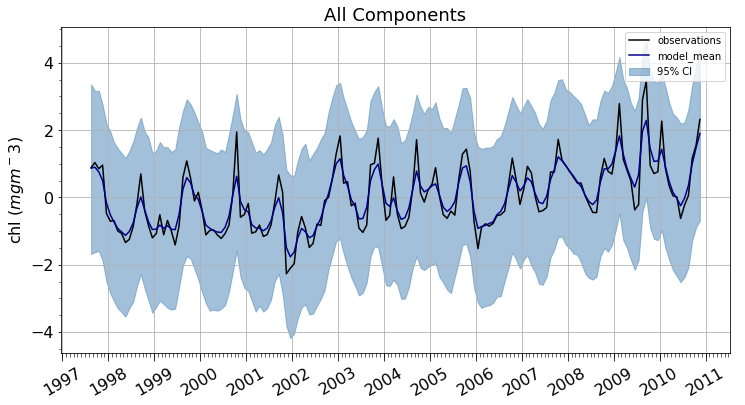

In [231]:
y_m6 = y_ppc6.mean(axis=0)
hpd6 = pm.hpd(y_ppc6)
_, ax = pl.subplots(figsize=(12, 6))
plot_component(ax, d_iostz.index, y_m6, hpd_=hpd6,
               obs=y_s, line_label='model_mean',
               y_axis_label='chl $(mg m^-3)$', ax_title='All Components')

### Local linear trend modeling

In [224]:
with pm.Model() as m7:
    delta_t = pm.GaussianRandomWalk('delta_t', mu=0, sd=1, shape=numobs-1)
    nu_t = pm.GaussianRandomWalk('nu_t', mu=delta_t, sd=1, shape=numobs)
    y_t = pm.Normal('y_t', mu=nu_t, sd=1, observed=y_s)

In [225]:
with m7:
    trace_7 = pm.sample(5000, tune=5000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [nu_t, delta_t]
100%|██████████| 10000/10000 [00:19<00:00, 505.28it/s]


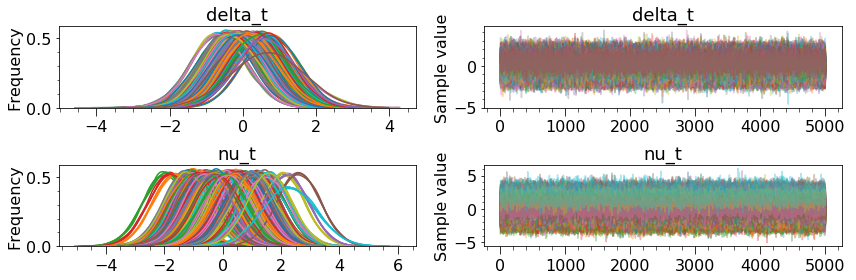

In [226]:
pm.traceplot(trace_7);

In [232]:
y_ppc7 = pm.sample_ppc(trace_7, model=m7)['y_t']

100%|██████████| 5000/5000 [00:00<00:00, 6284.92it/s]


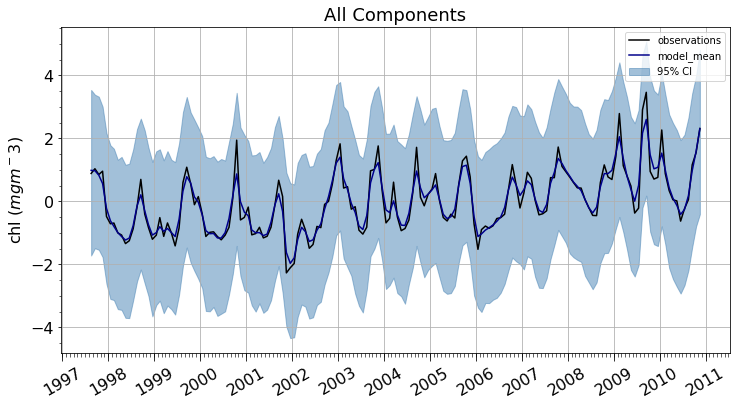

In [233]:
y_m7 = y_ppc7.mean(axis=0)
hpd7 = pm.hpd(y_ppc7)
_, ax = pl.subplots(figsize=(12, 6))
plot_component(ax, d_iostz.index, y_m7, hpd_=hpd7,
               obs=y_s, line_label='model_mean',
               y_axis_label='chl $(mg m^-3)$', ax_title='All Components')

### Pickle model results and scaler

In [88]:
m5.name = 'm5'
m4.name = 'm4'
m4i.name = 'm4_imputed'
m5i.name = 'm5_imputed'
resDict = dict(models=dict(m4=m4, m5=m5, m4i=m4i, m5i=m5i),
               traces=dict(m4=trace_4, m5=trace_5, m4i=trace_4i, m5i),
               scaler=std_scaler)
with open('./pikleJar/iostz_bayMdl.pkl', 'wb') as f:
    pickle.dump(resDict, f)

'm5'

In [79]:
resDict.keys(), resDict['models'].keys(), resDict['traces'].keys()

(dict_keys(['models', 'traces', 'scaler']),
 dict_keys(['m4', 'm5']),
 dict_keys(['m4', 'm5']))

In [94]:
pm.compare({m4:trace_4, m5:trace_5})

/accounts/ekarakoy/anaconda3/lib/python3.6/site-packages/pymc3/stats.py:211: UserWarning: For one or more samples the posterior variance of the
        log predictive densities exceeds 0.4. This could be indication of
        WAIC starting to fail see http://arxiv.org/abs/1507.04544 for details
        
  """)
/accounts/ekarakoy/anaconda3/lib/python3.6/site-packages/pymc3/stats.py:211: UserWarning: For one or more samples the posterior variance of the
        log predictive densities exceeds 0.4. This could be indication of
        WAIC starting to fail see http://arxiv.org/abs/1507.04544 for details
        
  """)


,WAIC,pWAIC,dWAIC,weight,SE,dSE,var_warn
m5,239.66,73.83,0,1,20.75,0,1
m4,254.37,77.72,14.71,0,20.88,5.75,1


In [95]:
pm.compare({m4:trace_4, m5:trace_5}, ic='LOO')

/accounts/ekarakoy/anaconda3/lib/python3.6/site-packages/pymc3/stats.py:292: UserWarning: Estimated shape parameter of Pareto distribution is
        greater than 0.7 for one or more samples.
        You should consider using a more robust model, this is because
        importance sampling is less likely to work well if the marginal
        posterior and LOO posterior are very different. This is more likely to
        happen with a non-robust model and highly influential observations.
  happen with a non-robust model and highly influential observations.""")


,LOO,pLOO,dLOO,weight,SE,dSE,shape_warn
m5,268.39,88.19,0,1,21.25,0,1
m4,286.86,93.96,18.47,0,21.22,6.28,1
